In [1]:
# Importing required python packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.model_selection import train_test_split
from sklearn import metrics


# Setting display option to show all columns and values
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Supress unnecessary warnings
import warnings
warnings.filterwarnings('ignore')

# Reading & Understanding Data

In [2]:
# Reading the dataset
tel_data=pd.read_csv('telecom_churn_data.csv')
# lookig at some of the entries in the dataset
tel_data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [3]:
# Shape of the data
tel_data.shape

(99999, 226)

There are total 99,999 rows and 226 columns in the dataset.

In [4]:
# Inspect the columns of the dataset
tel_data.columns

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)

In [5]:
# Summary of the dataset
tel_data.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [6]:
# Check the info to see the variable types and the null values present in different columns.
tel_data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
mobile_number               99999 non-null int64
circle_id                   99999 non-null int64
loc_og_t2o_mou              98981 non-null float64
std_og_t2o_mou              98981 non-null float64
loc_ic_t2o_mou              98981 non-null float64
last_date_of_month_6        99999 non-null object
last_date_of_month_7        99398 non-null object
last_date_of_month_8        98899 non-null object
last_date_of_month_9        98340 non-null object
arpu_6                      99999 non-null float64
arpu_7                      99999 non-null float64
arpu_8                      99999 non-null float64
arpu_9                      99999 non-null float64
onnet_mou_6                 96062 non-null float64
onnet_mou_7                 96140 non-null float64
onnet_mou_8                 94621 non-null float64
onnet_mou_9                 92254 non-null float64
offnet_mou_6                960

# Data Cleaning & EDA

There are following data column name which are having month as prefix:
- aug_vbc_3g
- jul_vbc_3g
- jun_vbc_3g
- sep_vbc_3g

We will correct these columns names with month no. as suffix similar to what we have column names for other columns.

In [7]:
# Column names correction in the dataframe
tel_data=tel_data.rename(columns={'jun_vbc_3g':'vbc_3g_6','jul_vbc_3g':'vbc_3g_7','aug_vbc_3g':'vbc_3g_8','sep_vbc_3g':'vbc_3g_9'})

Mobile no. column is kind of just a customer id. It will not add any value for data analysis. Therefore, We will drop for this column for data analysis.

In [8]:
# Dropping mobile no. column
tel_data=tel_data.drop(['mobile_number'],axis=1)

In [9]:
# Checking Unique values in each columns
col_unique_val=tel_data.nunique()
col_unique_val

circle_id                       1
loc_og_t2o_mou                  1
std_og_t2o_mou                  1
loc_ic_t2o_mou                  1
last_date_of_month_6            1
last_date_of_month_7            1
last_date_of_month_8            1
last_date_of_month_9            1
arpu_6                      85681
arpu_7                      85308
arpu_8                      83615
arpu_9                      79937
onnet_mou_6                 24313
onnet_mou_7                 24336
onnet_mou_8                 24089
onnet_mou_9                 23565
offnet_mou_6                31140
offnet_mou_7                31023
offnet_mou_8                30908
offnet_mou_9                30077
roam_ic_mou_6                6512
roam_ic_mou_7                5230
roam_ic_mou_8                5315
roam_ic_mou_9                4827
roam_og_mou_6                8038
roam_og_mou_7                6639
roam_og_mou_8                6504
roam_og_mou_9                5882
loc_og_t2t_mou_6            13539
loc_og_t2t_mou

In [10]:
# Features with a single unique value.
print(col_unique_val[col_unique_val == 1])

circle_id               1
loc_og_t2o_mou          1
std_og_t2o_mou          1
loc_ic_t2o_mou          1
last_date_of_month_6    1
last_date_of_month_7    1
last_date_of_month_8    1
last_date_of_month_9    1
std_og_t2c_mou_6        1
std_og_t2c_mou_7        1
std_og_t2c_mou_8        1
std_og_t2c_mou_9        1
std_ic_t2o_mou_6        1
std_ic_t2o_mou_7        1
std_ic_t2o_mou_8        1
std_ic_t2o_mou_9        1
dtype: int64


We will drop all the above columns from the dataset as these are having no variance in the data. Therefore these features will not add any value for model building.

In [11]:
# Dropping columns with single unique value
tel_data=tel_data.drop(col_unique_val[col_unique_val == 1].index,axis=1)

In [12]:
tel_data.shape

(99999, 209)

### Missing value treatement

In [13]:
#checking the columns having missing values
miscount=round(100*(tel_data.isnull().sum(axis=0)/len(tel_data.index)),2)
miscount=miscount[miscount>0]
miscount.sort_values(ascending=False)

count_rech_3g_6             74.85
fb_user_6                   74.85
date_of_last_rech_data_6    74.85
count_rech_2g_6             74.85
night_pck_user_6            74.85
av_rech_amt_data_6          74.85
total_rech_data_6           74.85
arpu_2g_6                   74.85
max_rech_data_6             74.85
arpu_3g_6                   74.85
arpu_3g_7                   74.43
count_rech_3g_7             74.43
count_rech_2g_7             74.43
av_rech_amt_data_7          74.43
max_rech_data_7             74.43
arpu_2g_7                   74.43
night_pck_user_7            74.43
date_of_last_rech_data_7    74.43
fb_user_7                   74.43
total_rech_data_7           74.43
total_rech_data_9           74.08
count_rech_2g_9             74.08
max_rech_data_9             74.08
date_of_last_rech_data_9    74.08
fb_user_9                   74.08
count_rech_3g_9             74.08
night_pck_user_9            74.08
av_rech_amt_data_9          74.08
arpu_2g_9                   74.08
arpu_3g_9     

We see here, there are lot of missing values showing in many columns. After thoroughly examining the data columns, we understood that lot of missing values have some meaning. Hence, we will impute the missing values based on that meaning.

We can see above that high missing values columns (having more than 70% missing values) are all datapack related columns.

Datapack related columns are as below:
    
'date_of_last_rech_data', 'total_rech_data', 'max_rech_data', 'av_rech_amt_data', 'count_rech_2g', 'count_rech_3g', 'arpu_2g', 'arpu_3g', 'night_pck_user', 'fb_user', 'vol_2g_mb', 'vol_3g_mb', 'monthly_2g', 'sachet_2g', 'monthly_3g', 'sachet_3g', 'vbc_3g'

When we see the missing values in above mentioned columns for any month (6, 7, 8, 9 month), the pattern is clearly visible.

All the missing values of data pack related columns for a particular month is same. Eg for '6' month, missing values are 74.85% for all the data pack related columns. Here, we see that If there is NaN value in 'date_of_last_rech_data' columns for any month, it means that user has not recharge the data pack for that month.

For Eg. We will look at datapack related columns for 6th month with respect to column 'date_of_last_rech_data_6' to see the missing values pattern.

In [14]:
# Datapack related columns for 6th month:
datapck_cols=['total_rech_data_6', 'max_rech_data_6', 'av_rech_amt_data_6', 'count_rech_2g_6', 'count_rech_3g_6', 'arpu_2g_6',
              'arpu_3g_6', 'night_pck_user_6', 'fb_user_6', 'vol_2g_mb_6', 'vol_3g_mb_6', 'monthly_2g_6', 'sachet_2g_6', 
              'monthly_3g_6', 'sachet_3g_6']
tel_data[tel_data['date_of_last_rech_data_6'].isna()][datapck_cols].head() 

,total_rech_data_6,max_rech_data_6,av_rech_amt_data_6,count_rech_2g_6,count_rech_3g_6,arpu_2g_6,arpu_3g_6,night_pck_user_6,fb_user_6,vol_2g_mb_6,vol_3g_mb_6,monthly_2g_6,sachet_2g_6,monthly_3g_6,sachet_3g_6
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0,0,0,0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0,0,0,0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0,0,0,0
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0,0,0,0
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0,0,0,0


We can infer from above that the customers who have not recharge the datapack for 6th month, has these missing values for datapack related columns. This means that these columns missing values can be imputed with 0

Data pack related columns having missing values are as below. We will replace the missing values with '0' for those users in following corresponding columns
- total_rech_data
- max_rech_data
- av_rech_amt_data
- count_rech_2g
- count_rech_3g
- arpu_2g
- arpu_3g
- night_pck_user
- fb_user

In [15]:
# Creating list of above mentioned columns to impute with '0' for each month (6,7,8,9)
col_select=['total_rech_data', 'max_rech_data', 'av_rech_amt_data', 'count_rech_2g', 'count_rech_3g', 'arpu_2g','arpu_3g',
         'night_pck_user', 'fb_user']
col_to_impute=[]
for i in range(6,10):
    for cols in col_select:
        col_to_impute.append(cols+'_'+str(i))
print(col_to_impute)

['total_rech_data_6', 'max_rech_data_6', 'av_rech_amt_data_6', 'count_rech_2g_6', 'count_rech_3g_6', 'arpu_2g_6', 'arpu_3g_6', 'night_pck_user_6', 'fb_user_6', 'total_rech_data_7', 'max_rech_data_7', 'av_rech_amt_data_7', 'count_rech_2g_7', 'count_rech_3g_7', 'arpu_2g_7', 'arpu_3g_7', 'night_pck_user_7', 'fb_user_7', 'total_rech_data_8', 'max_rech_data_8', 'av_rech_amt_data_8', 'count_rech_2g_8', 'count_rech_3g_8', 'arpu_2g_8', 'arpu_3g_8', 'night_pck_user_8', 'fb_user_8', 'total_rech_data_9', 'max_rech_data_9', 'av_rech_amt_data_9', 'count_rech_2g_9', 'count_rech_3g_9', 'arpu_2g_9', 'arpu_3g_9', 'night_pck_user_9', 'fb_user_9']


In [16]:
# Imputing missing values with '0' for above mentioned columns for each month(6,7,8,9).

tel_data[col_to_impute]=tel_data[col_to_impute].fillna(0)

We see from the data dictionary, the date columns won't add any value to model building. So we will drop these date columns

In [17]:
# Creating list of date columns for each month (6,7,8,9)
date_cols=['date_of_last_rech', 'date_of_last_rech_data']
cols_drop=[]
for i in range(6,10):
    for cols in date_cols:
        cols_drop.append(cols+'_'+str(i))
print(cols_drop)

['date_of_last_rech_6', 'date_of_last_rech_data_6', 'date_of_last_rech_7', 'date_of_last_rech_data_7', 'date_of_last_rech_8', 'date_of_last_rech_data_8', 'date_of_last_rech_9', 'date_of_last_rech_data_9']


In [18]:
#Drop the date columns
tel_data=tel_data.drop(cols_drop,axis=1)

In [19]:
tel_data.shape

(99999, 201)

In [20]:
#checking the columns having missing values again:
miscount=round(100*(tel_data.isnull().sum(axis=0)/len(tel_data.index)),2)
miscount=miscount[miscount>0]
miscount.sort_values(ascending=False)

ic_others_9         7.75
loc_ic_t2t_mou_9    7.75
std_ic_t2t_mou_9    7.75
loc_og_t2t_mou_9    7.75
loc_ic_mou_9        7.75
std_og_t2m_mou_9    7.75
loc_og_t2m_mou_9    7.75
loc_ic_t2m_mou_9    7.75
loc_og_t2f_mou_9    7.75
og_others_9         7.75
std_ic_t2m_mou_9    7.75
loc_og_t2c_mou_9    7.75
spl_og_mou_9        7.75
loc_og_mou_9        7.75
isd_og_mou_9        7.75
std_og_mou_9        7.75
std_og_t2t_mou_9    7.75
std_og_t2f_mou_9    7.75
roam_og_mou_9       7.75
loc_ic_t2f_mou_9    7.75
offnet_mou_9        7.75
onnet_mou_9         7.75
spl_ic_mou_9        7.75
std_ic_t2f_mou_9    7.75
roam_ic_mou_9       7.75
isd_ic_mou_9        7.75
std_ic_mou_9        7.75
roam_og_mou_8       5.38
loc_og_mou_8        5.38
spl_ic_mou_8        5.38
og_others_8         5.38
offnet_mou_8        5.38
spl_og_mou_8        5.38
isd_og_mou_8        5.38
isd_ic_mou_8        5.38
std_ic_t2m_mou_8    5.38
ic_others_8         5.38
std_og_mou_8        5.38
std_og_t2t_mou_8    5.38
onnet_mou_8         5.38


In [21]:
miscount.index

Index(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'onnet_mou_9',
       'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'offnet_mou_9',
       'roam_ic_mou_6', 'roam_ic_mou_7',
       ...
       'spl_ic_mou_8', 'spl_ic_mou_9', 'isd_ic_mou_6', 'isd_ic_mou_7',
       'isd_ic_mou_8', 'isd_ic_mou_9', 'ic_others_6', 'ic_others_7',
       'ic_others_8', 'ic_others_9'],
      dtype='object', length=108)

We see above that many 'mou' data columns (minutes of usage-voice calls) have similar % of missing values for particular month. These numerical data columns are correlated. We will impute these data with iterative imputer method.

In [22]:
# Saving the list of columns to impute through iterative imputer method:
cols_to_impute = miscount.index

We will see the data distribution in these columns in order to decide the metrices to impute these missing values.

In [23]:
# Checking data distribution of numerical columns
tel_data.describe(percentiles = [.05, .25, .5, .75, .95])

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
count,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000

We can see here that almost all the columns have outliers in the dataset. Therefore, we will use median of data columns as initial_strategy in iterative imputer

In [24]:
# Importing libraries to perform iterative imputer:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [25]:
# Applying iterative imputer method to fill the missing values:
ii = IterativeImputer(random_state=0,max_iter=10,n_nearest_features=4, initial_strategy='median')
ii.fit(tel_data[cols_to_impute])
tel_data[cols_to_impute] = pd.DataFrame(data=ii.transform(tel_data[cols_to_impute]),columns=[cols_to_impute],dtype='float64')

# Checking the dataframe after imputation
tel_data.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
0,197.385,214.816,213.803,21.100,50.11804,79.707677,0.00,61.362265,107.837975,166.566189,0.00,122.848391,6.669416,0.721107,0.00,1.790552,9.070051,3.898995,0.00,5.143029,14.347589,-12.314564,0.00,19.524921,48.033444,28.361811,0.00,8.560957,0.798443,0.73223,0.00,3.023884,0.889978,0.591796,0.00,1.102452,103.809097,26.83363,0.00,15.23374,45.267835,33.568064,0.00,0.222032,55.320003,17.761636,0.00,30.001047,0.661626,0.280356,0.00,0.385668,84.967992,54.749074,0.00,103.359441,-0.020095,0.036599,0.0,0.128097,3.092006,3.154402,0.00,4.010253,0.393768,0.012165,0.0,0.004478,0.00,0.00,0.00,0.00,10.483871,-0.260879,0.16,-7.444977,55.813411,47.015946,4.13,53.216118,8.317938,8.794198,1.15,8.172017,44.863798,98.341008,5.44,98.709028,6.159217,5.016653,0.00,2.587075,11.008711,6.17,0.00,16.082296,1.074176,1.349668,0.00,0.728109,14.012593,7.102438,0.00,18.613042,0.00,0.00,5.44,0.00,0.057198,0.030952,0.0,0.10923,4.55162,4.435453,0.0,7.126591,0.540718,0.62077,0.0,0.758824,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,30

In [26]:
#checking the columns having missing values
miscount=round(100*(tel_data.isnull().sum(axis=0)/len(tel_data.index)),2)
miscount

arpu_6                0.0
arpu_7                0.0
arpu_8                0.0
arpu_9                0.0
onnet_mou_6           0.0
onnet_mou_7           0.0
onnet_mou_8           0.0
onnet_mou_9           0.0
offnet_mou_6          0.0
offnet_mou_7          0.0
offnet_mou_8          0.0
offnet_mou_9          0.0
roam_ic_mou_6         0.0
roam_ic_mou_7         0.0
roam_ic_mou_8         0.0
roam_ic_mou_9         0.0
roam_og_mou_6         0.0
roam_og_mou_7         0.0
roam_og_mou_8         0.0
roam_og_mou_9         0.0
loc_og_t2t_mou_6      0.0
loc_og_t2t_mou_7      0.0
loc_og_t2t_mou_8      0.0
loc_og_t2t_mou_9      0.0
loc_og_t2m_mou_6      0.0
loc_og_t2m_mou_7      0.0
loc_og_t2m_mou_8      0.0
loc_og_t2m_mou_9      0.0
loc_og_t2f_mou_6      0.0
loc_og_t2f_mou_7      0.0
loc_og_t2f_mou_8      0.0
loc_og_t2f_mou_9      0.0
loc_og_t2c_mou_6      0.0
loc_og_t2c_mou_7      0.0
loc_og_t2c_mou_8      0.0
loc_og_t2c_mou_9      0.0
loc_og_mou_6          0.0
loc_og_mou_7          0.0
loc_og_mou_8

There are no missing values in the dataset now.

# Data Preparation

In [27]:
tel_data.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
0,197.385,214.816,213.803,21.100,50.11804,79.707677,0.00,61.362265,107.837975,166.566189,0.00,122.848391,6.669416,0.721107,0.00,1.790552,9.070051,3.898995,0.00,5.143029,14.347589,-12.314564,0.00,19.524921,48.033444,28.361811,0.00,8.560957,0.798443,0.73223,0.00,3.023884,0.889978,0.591796,0.00,1.102452,103.809097,26.83363,0.00,15.23374,45.267835,33.568064,0.00,0.222032,55.320003,17.761636,0.00,30.001047,0.661626,0.280356,0.00,0.385668,84.967992,54.749074,0.00,103.359441,-0.020095,0.036599,0.0,0.128097,3.092006,3.154402,0.00,4.010253,0.393768,0.012165,0.0,0.004478,0.00,0.00,0.00,0.00,10.483871,-0.260879,0.16,-7.444977,55.813411,47.015946,4.13,53.216118,8.317938,8.794198,1.15,8.172017,44.863798,98.341008,5.44,98.709028,6.159217,5.016653,0.00,2.587075,11.008711,6.17,0.00,16.082296,1.074176,1.349668,0.00,0.728109,14.012593,7.102438,0.00,18.613042,0.00,0.00,5.44,0.00,0.057198,0.030952,0.0,0.10923,4.55162,4.435453,0.0,7.126591,0.540718,0.62077,0.0,0.758824,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,30

Looking at the data dictionary and data columns, we can see that few following columns are categorical. We will change the data types for those columns
- night_pck_user, fb_user

In [28]:
# Creating list of above columns for each month (6,7,8,9)
cat_cols=['night_pck_user_6', 'fb_user_6', 'night_pck_user_7', 'fb_user_7', 'night_pck_user_8', 'fb_user_8',
          'night_pck_user_9', 'fb_user_9']

In [29]:
# Checking the values counts for these columns
for col in cat_cols:
    print(tel_data[col].value_counts())

0.0    99368
1.0      631
Name: night_pck_user_6, dtype: int64
0.0    76999
1.0    23000
Name: fb_user_6, dtype: int64
0.0    99410
1.0      589
Name: night_pck_user_7, dtype: int64
0.0    76761
1.0    23238
Name: fb_user_7, dtype: int64
0.0    99450
1.0      549
Name: night_pck_user_8, dtype: int64
0.0    76536
1.0    23463
Name: fb_user_8, dtype: int64
0.0    99585
1.0      414
Name: night_pck_user_9, dtype: int64
0.0    77681
1.0    22318
Name: fb_user_9, dtype: int64


In [30]:
# converting above variables to categorical based on Data dictionary:
tel_data[cat_cols]= tel_data[cat_cols].astype('object')

In [31]:
tel_data.describe()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
count,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,

In [32]:
tel_data.shape

(99999, 201)

<b> Extracting high value customers data from original dataset </b>

As per the Business problem statement, Approximately 80% of revenue comes from the top 20% customers (called high-value customers). Thus, if we can reduce churn of the high-value customers, we will be able to reduce significant revenue leakage. Therefore, In this analysis we will focus on high value customers. 

So we will extract the high value customers related data from original dataset for further analysis and model building.

<b>Definition of High-value customers:</b>

Customers who have recharged with an amount more than or equal 70th percentile of the average recharge amount in the first two months (the good phase).

To find the high value customers, we will create a new column for average recharge amount for month 6 & 7. 

In [33]:
# Creating a new column for average recharge amount for month 6 & 7.
tel_data['avg_rech_amt_6&7']=round((tel_data['total_rech_amt_6']+tel_data['total_rech_amt_7'])/2,2)

In [34]:
# looking at the 70th percentile average recharge amount of 6&7th month
print("Average recharge amount of 6&7th month at 70th percentile: {0}".format(tel_data['avg_rech_amt_6&7'].quantile(0.70)))

Average recharge amount of 6&7th month at 70th percentile: 368.5


Creating new dataframe (teldata_hv) for high value customer who has recharged with amount more than or equal to 70 percentile of average amount in 6 & 7 month

In [35]:
# Creating new dataframe (teldata_hv) for high value customer
teldata_hv = tel_data.loc[tel_data['avg_rech_amt_6&7'] >= tel_data['avg_rech_amt_6&7'].quantile(0.70)]

In [36]:
# Dropping the created variable as it is not required for further analysis
teldata_hv=teldata_hv.drop('avg_rech_amt_6&7',axis=1)

In [37]:
teldata_hv.shape

(30011, 201)

There are approx. 30K high value customers data available.

#### Defining Churned customer

In churn prediction, we assume that there are three phases of customer lifecycle :
1. Good Phase
2. Action Phase
3. Churn Phase

Churn phase is the last month (9th) here. We define whether customer has churned or not based on this phase information. 

In ‘Churn’ phase, the customer is said to have churned if that cusomter has not made any calls and have not used mobile internet even once. 

So we will tag the churned customers (churn=1, else 0) as follows: Those who have not made any calls (total_ic_mou_9, total_og_mou_9 are 0) AND have not used mobile internet even once (vol_2g_mb_9, vol_3g_mb_9 are 0) in 9th month.


In [38]:
# Creating a column for total calls (incoming & outgoing) for 9th month
teldata_hv['total_ic&og_mou_9']=teldata_hv['total_ic_mou_9']+teldata_hv['total_og_mou_9']

# Creating a column for total data usage (2g & 3g) for 9th month
teldata_hv['vol_2&3g_mb_9']=teldata_hv['vol_2g_mb_9']+teldata_hv['vol_3g_mb_9']

In [39]:
# Creating a 'Churn' column which defines whether the customer has churned or not in 9th month:
teldata_hv['Churn'] = np.where((teldata_hv['total_ic&og_mou_9'] == 0) & (teldata_hv['vol_2&3g_mb_9'] == 0), 1, 0)

In [40]:
# Checking the dataset
teldata_hv.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,total_ic&og_mou_9,vol_2&3g_mb_9,Churn
7,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,75.627723,453.43,567.16,325.91,396.476231,16.23,33.49,31.64,19.694628,23.74,12.59,38.06,10.110239,51.39,31.38,40.28,71.641153,308.63,447.38,162.28,190.717965,62.13,55.14,53.23,11.013894,0.0,0.0,0.00,1.124914,422.16,533.91,255.79,230.149915,4.30,23.29,12.01,26.179561,49.89,31.76,49.14,186.948236,6.66,20.08,16.68,12.83329,60.86,75.14,77.84,93.661043,0.0,0.18,10.01,4.862832,4.50,0.00,6.50,3.843306,0.00,0.0,0.0,0.012747,487.53,609.24,350.16,0.00,58.14,32.26,27.31,44.185112,217.56,221.49,121.19,164.219951,152.16,101.46,39.53,103.498664,427.88,355.23,188.04,318.739273,36.89,11.83,30.39,24.42995,91.44,126.99,141.33,45.306291,52.19,34.24,22.21,24.892244,180.54,173.08,193.94,90.497898,626.46,558.04,428.74,0.00,0.21,0.0,0.0,0.072504,2.06,14.53,31.59,18.902603,15.74,15.19,15.14,6.510477,5,5,7,3,1580,790,3638,0,1580,790,1580,0,0,0,779,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

It is important to note that at the time of prediction (i.e. the action months), this 9th month data is not available to us for prediction. Thus, after tagging churn as 1/0 based on this phase, we will discard all data corresponding to 9th month.

In [41]:
# Columns related to 9th month
col_9=[i for i in teldata_hv.columns if i[-2:]=='_9']
print(col_9)

['arpu_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9', 'last_day_rch_amt_9', 'total_rech_data_9', 'max_rech_data_9', 'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'arpu_3g_9', 'arpu_2g_9', 'night_pck_user_9', 'monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9', 'fb_user_9', 'vbc_3g_9', 'total_ic&og_mou_9', 'vol_2&3g_mb_9']


In [42]:
# Dropping columns related to 9th month from the dataframe
teldata_hv=teldata_hv.drop(col_9, axis=1)

In [43]:
teldata_hv.shape

(30011, 152)

Now this teldata_hv is data of high value customer with churn label assigned to each customer based on 9th month data. There are total 30011 rows in the dataset.

teldata_hv shall be considered for model building and evaluation

In [44]:
# Categorical columns
tel_cat=teldata_hv.select_dtypes(include='object')

In [45]:
# Numeric columns
tel_num=teldata_hv.select_dtypes(include=['int64','float64'])

In [46]:
tel_num.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,2.0,3.0,0.0,154.0,23.0,0.0,2.0,3.0,0.0,0.0,0.0,0.0,177.0,69.0,0.0,356.0,0.03,0.0,750.95,11.94,0.0,0.0,19.83,0.0,0.0,0.0,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16
13,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.0,0.00,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,

In [47]:
# Checking data distribution of numerical columns
teldata_hv.describe(percentiles = [.05, .25, .5, .75, .95])

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,Churn
count,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000


Since, there are outliers in high value customer dataset, we will do outlier treament here.

## Outlier Treatment

In [48]:
# # Outlier detection

Q1 = tel_num.quantile(0.01)
Q3 = tel_num.quantile(0.99)
IQR = Q3 - Q1

print(((tel_num < (Q1 - 1.5 * IQR)) | (tel_num > (Q3 + 1.5 * IQR))).sum())

arpu_6                 18
arpu_7                 19
arpu_8                 20
onnet_mou_6             9
onnet_mou_7            14
onnet_mou_8            13
offnet_mou_6            5
offnet_mou_7            7
offnet_mou_8           12
roam_ic_mou_6          41
roam_ic_mou_7          58
roam_ic_mou_8          52
roam_og_mou_6          43
roam_og_mou_7          47
roam_og_mou_8          62
loc_og_t2t_mou_6       45
loc_og_t2t_mou_7       48
loc_og_t2t_mou_8       42
loc_og_t2m_mou_6       11
loc_og_t2m_mou_7       12
loc_og_t2m_mou_8       10
loc_og_t2f_mou_6       37
loc_og_t2f_mou_7       38
loc_og_t2f_mou_8       37
loc_og_t2c_mou_6       51
loc_og_t2c_mou_7       54
loc_og_t2c_mou_8       38
loc_og_mou_6           11
loc_og_mou_7           17
loc_og_mou_8           11
std_og_t2t_mou_6        9
std_og_t2t_mou_7       14
std_og_t2t_mou_8       12
std_og_t2m_mou_6       11
std_og_t2m_mou_7       10
std_og_t2m_mou_8       15
std_og_t2f_mou_6       65
std_og_t2f_mou_7       78
std_og_t2f_m

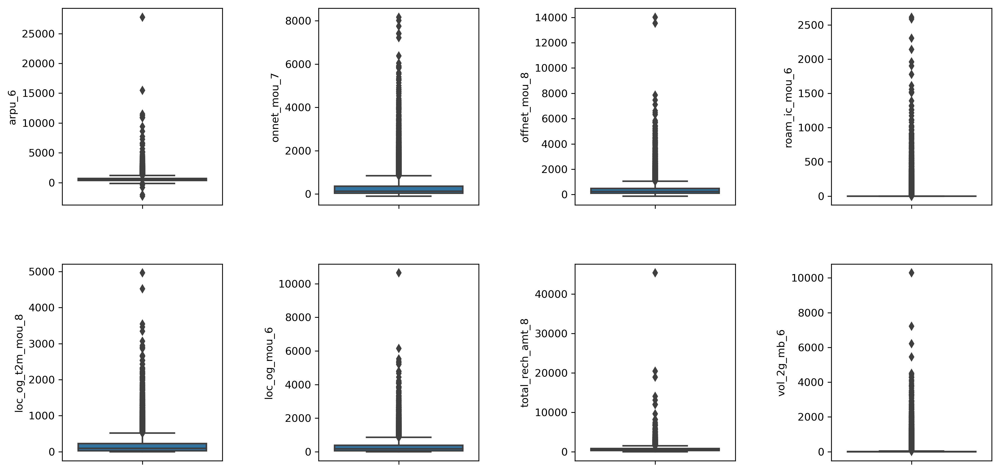

In [49]:
# Outliers are checked for few numeric columns through Boxplots
plt.figure(figsize=(16,8),dpi=300)
plt.subplots_adjust(wspace = 0.6,hspace = 0.3)

plt.subplot(2,4,1)
sns.boxplot(y=teldata_hv['arpu_6'])
plt.subplot(2,4,2)
sns.boxplot(y=teldata_hv['onnet_mou_7'])
plt.subplot(2,4,3)
sns.boxplot(y=teldata_hv['offnet_mou_8'])
plt.subplot(2,4,4)
sns.boxplot(y=teldata_hv['roam_ic_mou_6'])
plt.subplot(2,4,5)
sns.boxplot(y=teldata_hv['loc_og_t2m_mou_8'])
plt.subplot(2,4,6)
sns.boxplot(y=teldata_hv['loc_og_mou_6'])
plt.subplot(2,4,7)
sns.boxplot(y=teldata_hv['total_rech_amt_8'])
plt.subplot(2,4,8)
sns.boxplot(y=teldata_hv['vol_2g_mb_6'])

In [50]:
# Outlier treatment by IQR method

# Creating function for outlier removal.
def remove_outlier(df_in, col_name): 
    Q1 = df_in[col_name].quantile(0.01) 
    Q3 = df_in[col_name].quantile(0.99) 
    IQR=Q3-Q1               # Interquantile range
    df_out = df_in.loc[(df_in[col_name] >= (Q1 - 1.5 * IQR)) & (df_in[col_name] <= (Q3 + 1.5 * IQR))]
    return(df_out)

# Removing outliers in numeric columns
for i in tel_num.columns:
    teldata_hv = remove_outlier(teldata_hv,i)

In [51]:
teldata_hv.shape

(26722, 152)

### Visualizing Numeric variables

#### Checking the distribution of the few numeric variables

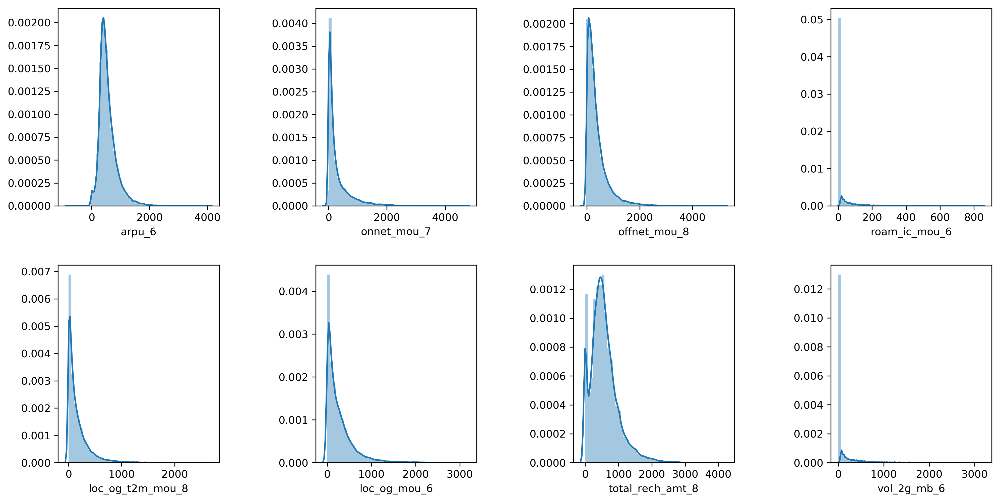

In [52]:
plt.figure(figsize=(16,8),dpi=300)
plt.subplots_adjust(wspace = 0.6,hspace = 0.3)

plt.subplot(2,4,1)
sns.distplot(teldata_hv['arpu_6'])
plt.subplot(2,4,2)
sns.distplot(teldata_hv['onnet_mou_7'])
plt.subplot(2,4,3)
sns.distplot(teldata_hv['offnet_mou_8'])
plt.subplot(2,4,4)
sns.distplot(teldata_hv['roam_ic_mou_6'])
plt.subplot(2,4,5)
sns.distplot(teldata_hv['loc_og_t2m_mou_8'])
plt.subplot(2,4,6)
sns.distplot(teldata_hv['loc_og_mou_6'])
plt.subplot(2,4,7)
sns.distplot(teldata_hv['total_rech_amt_8'])
plt.subplot(2,4,8)
sns.distplot(teldata_hv['vol_2g_mb_6'])

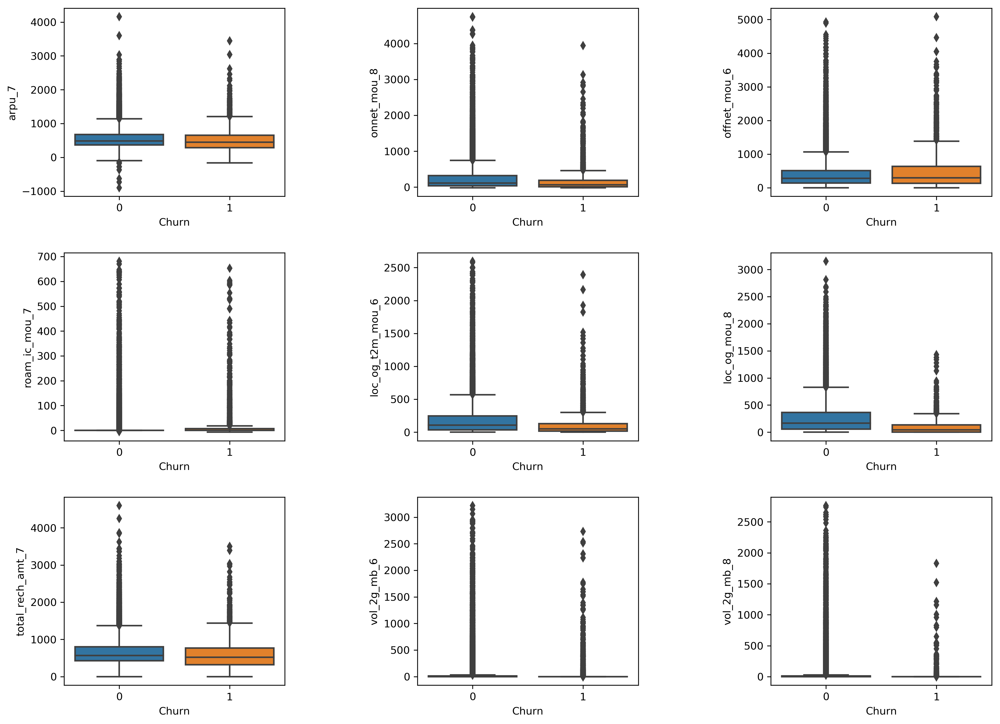

In [53]:
# Checking data distribution of few numeric columns through Boxplots with respect to target variable
plt.figure(figsize=(16,12),dpi=300)
plt.subplots_adjust(wspace = 0.6,hspace = 0.3)

plt.subplot(3,3,1)
sns.boxplot(x='Churn',y='arpu_7',data=teldata_hv)
plt.subplot(3,3,2)
sns.boxplot(x='Churn',y='onnet_mou_8',data=teldata_hv)
plt.subplot(3,3,3)
sns.boxplot(x='Churn',y='offnet_mou_6',data=teldata_hv)
plt.subplot(3,3,4)
sns.boxplot(x='Churn',y='roam_ic_mou_7',data=teldata_hv)
plt.subplot(3,3,5)
sns.boxplot(x='Churn',y='loc_og_t2m_mou_6',data=teldata_hv)
plt.subplot(3,3,6)
sns.boxplot(x='Churn',y='loc_og_mou_8',data=teldata_hv)
plt.subplot(3,3,7)
sns.boxplot(x='Churn',y='total_rech_amt_7',data=teldata_hv)
plt.subplot(3,3,8)
sns.boxplot(x='Churn',y='vol_2g_mb_6',data=teldata_hv)
plt.subplot(3,3,9)
sns.boxplot(x='Churn',y='vol_2g_mb_8',data=teldata_hv)

In few columns i.e. 'onnet_mou_8', 'loc_og_t2m_mou_6', 'loc_og_mou_8', it can be seen that values are lower for customer who got churned than the non-churn customer

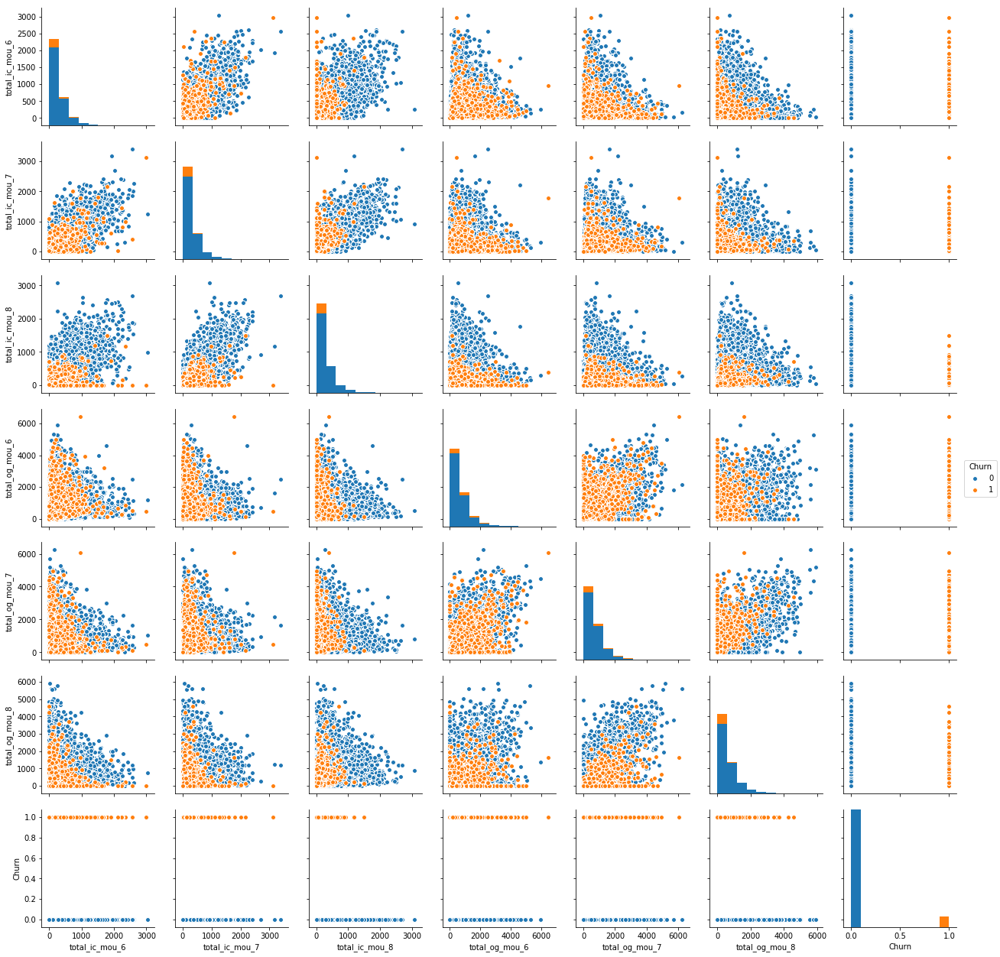

In [54]:
# Checking total incoming & outgoing voice call minute usage data with respect to target variable.
sns.pairplot(data=teldata_hv[['total_ic_mou_6','total_ic_mou_7','total_ic_mou_8','total_og_mou_6','total_og_mou_7',
                              'total_og_mou_8','Churn']],hue='Churn')

We can see that there are correlations between these columns.

We can see datapoints for churned and non-churned customers separately where churned customer datapoints having lower values of 'mou' mostly. Which means these columns have effect on deciding whether customer is going to churn or not.

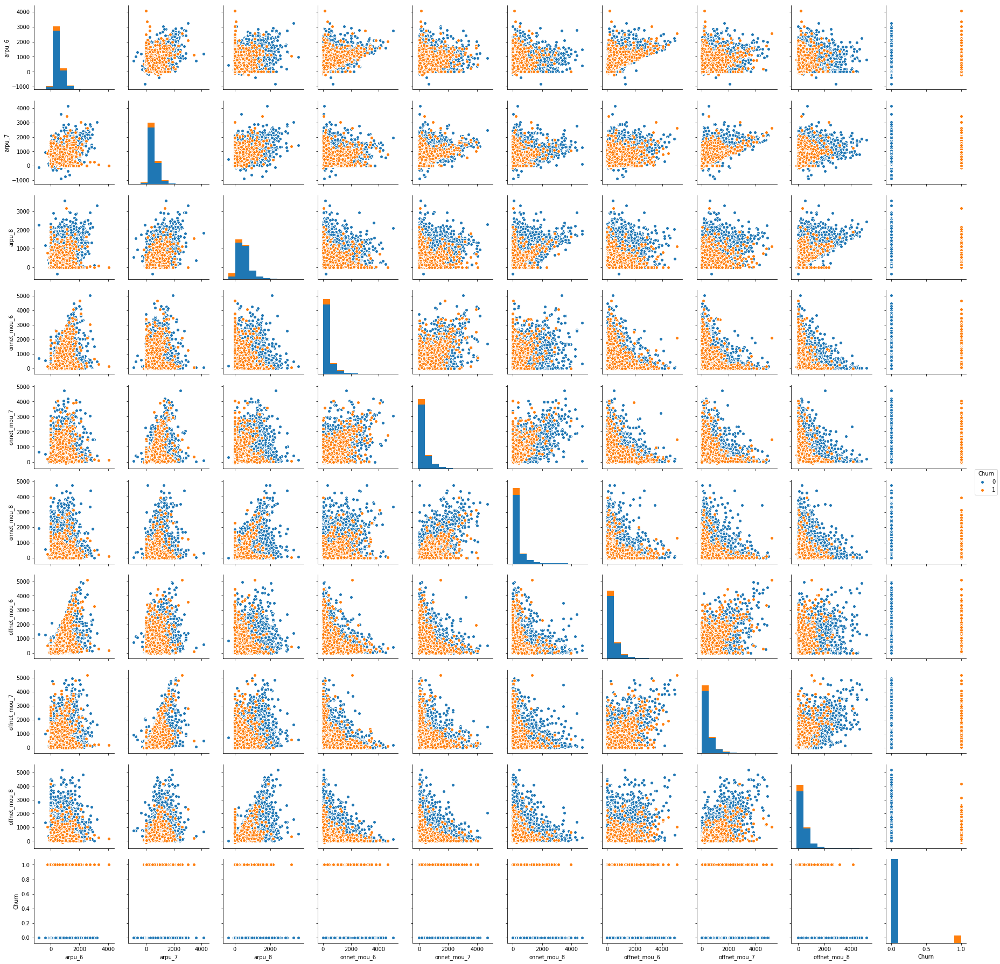

In [55]:
# Checking avergare revenue per user (arpu), data of all kind of calls within the same operator network (onnet), 
# outside the operator network (offnet) with respect to target variable.
sns.pairplot(data=teldata_hv[['arpu_6','arpu_7','arpu_8','onnet_mou_6','onnet_mou_7','onnet_mou_8','offnet_mou_6',
                              'offnet_mou_7','offnet_mou_8', 'Churn']],hue='Churn')

We can see that there are correlations between few columns.

We can see datapoints for churned and non-churned customers separately where churned customer datapoints having lower values of 'arpu' and 'mou' mostly. Which means these columns have effect on deciding whether customer is going to churn or not.

### Visualizing Categorical variables

In [56]:
tel_cat.columns

Index(['night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6',
       'fb_user_7', 'fb_user_8'],
      dtype='object')

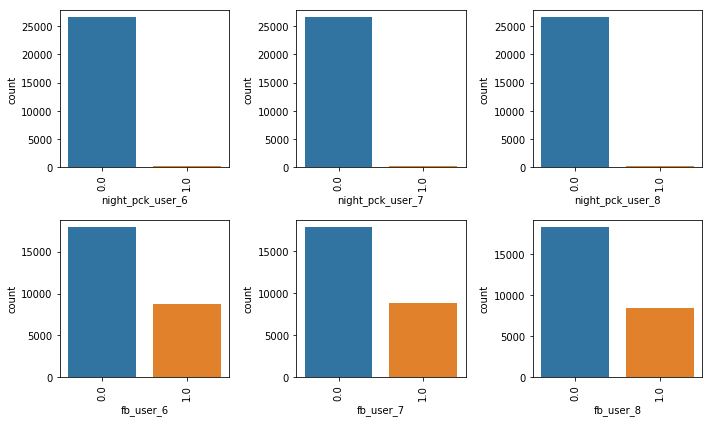

In [57]:
# Visualising Categorical Data

plt.figure(figsize=(10, 20))
i = 0
for col in tel_cat.columns :
    plt.subplot(7,3,i+1)
    ax = sns.countplot(x = col, data = teldata_hv)
    ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
    i+=1
plt.tight_layout()
plt.show()

We can see from the above graph that all night_pck_user columns are very skewed towards 0 value.

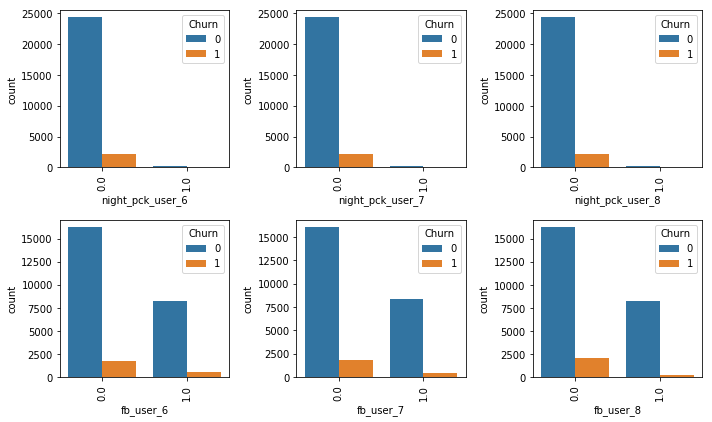

In [58]:
# Checking distribution of Categorical variables with respect to Target variable 'Churn'

plt.figure(figsize=(10, 20))
i = 0
for col in tel_cat.columns :
    plt.subplot(7,3,i+1)
    ax = sns.countplot(x = col, hue= 'Churn', data = teldata_hv)
    ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
    i+=1
plt.tight_layout()
plt.show()

We can't see clear pattern for night_pck_user & fb_user who got churned or not churned.

### Derived Features

In ‘good’ phase, the customer is happy with the service and behaves as usual. This is 6 & 7th month. Therefore, we will create data for good phase by averaging the numeric data of 6th & 7th months.


In [59]:
# Columns related to 6th or 7th month
col_6=[i for i in tel_num.columns if i[-2:]=='_6']
col_name=[i[:-2] for i in col_6]
print(col_name)

['arpu', 'onnet_mou', 'offnet_mou', 'roam_ic_mou', 'roam_og_mou', 'loc_og_t2t_mou', 'loc_og_t2m_mou', 'loc_og_t2f_mou', 'loc_og_t2c_mou', 'loc_og_mou', 'std_og_t2t_mou', 'std_og_t2m_mou', 'std_og_t2f_mou', 'std_og_mou', 'isd_og_mou', 'spl_og_mou', 'og_others', 'total_og_mou', 'loc_ic_t2t_mou', 'loc_ic_t2m_mou', 'loc_ic_t2f_mou', 'loc_ic_mou', 'std_ic_t2t_mou', 'std_ic_t2m_mou', 'std_ic_t2f_mou', 'std_ic_mou', 'total_ic_mou', 'spl_ic_mou', 'isd_ic_mou', 'ic_others', 'total_rech_num', 'total_rech_amt', 'max_rech_amt', 'last_day_rch_amt', 'total_rech_data', 'max_rech_data', 'count_rech_2g', 'count_rech_3g', 'av_rech_amt_data', 'vol_2g_mb', 'vol_3g_mb', 'arpu_3g', 'arpu_2g', 'monthly_2g', 'sachet_2g', 'monthly_3g', 'sachet_3g', 'vbc_3g']


We will get all the columns ending with '6' (june) and '_7' (july) & will take average of each & create new column for good phase

Then we will drop the _6 and _7 columns later

In [60]:
# Creating columns for average of 6th & 7th month:
cols_to_drop=[]

for col in col_name:
     if col+'_6' in list(tel_num.columns) and col+'_7' in list(tel_num.columns):
        teldata_hv[col+'_6&7']= (teldata_hv[col+'_6']+teldata_hv[col+'_7'])/2
        cols_to_drop.append(col+'_6')
        cols_to_drop.append(col+'_7')

In [61]:
# the original columns of 6th & 7th months to be dropped:
print(cols_to_drop)

['arpu_6', 'arpu_7', 'onnet_mou_6', 'onnet_mou_7', 'offnet_mou_6', 'offnet_mou_7', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_og_mou_6', 'roam_og_mou_7', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_mou_6', 'loc_og_mou_7', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_mou_6', 'std_og_mou_7', 'isd_og_mou_6', 'isd_og_mou_7', 'spl_og_mou_6', 'spl_og_mou_7', 'og_others_6', 'og_others_7', 'total_og_mou_6', 'total_og_mou_7', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7', 'loc_ic_mou_6', 'loc_ic_mou_7', 'std_ic_t2t_mou_6', 'std_ic_t2t_mou_7', 'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7', 'std_ic_t2f_mou_6', 'std_ic_t2f_mou_7', 'std_ic_mou_6', 'std_ic_mou_7', 'total_ic_mou_6', 'total_ic_mou_7', 'spl_ic_mou_6', 'spl_ic_mou_7', 'is

In [62]:
# Drop the columns from month 6 and 7 whose average value column has been created.
teldata_hv=teldata_hv.drop(cols_to_drop,axis=1)


In the ‘action’ phase: The customer experience starts to sore in this phase and usually shows different behaviour than the ‘good’ months. This is 8th month.

Therefore, we will take difference of good phase & action phase to create new features which make more sense.

In [63]:
# Numeric columns
tel_num=teldata_hv.select_dtypes(include=['int32','int64','float64'])

In [64]:
# Find the difference in the usage pattern from average of month 6 and 7 and month 8 and creating a list of original columns to be dropped

cols_to_drop1=[]

for col in col_name:
     if col+'_6&7' in list(tel_num.columns) and col+'_8' in list(tel_num.columns):
        teldata_hv[col+'_diff']= (teldata_hv[col+'_6&7']-teldata_hv[col+'_8'])
        cols_to_drop1.append(col+'_6&7')
        cols_to_drop1.append(col+'_8')

In [65]:
# Drop the columns for which the difference has been created
teldata_hv=teldata_hv.drop(cols_to_drop1,axis=1) 

# checking the dataframe after creating the derived features
teldata_hv.head()

,night_pck_user_6,night_pck_user_7,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8,aon,Churn,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_t2t_mou_diff,loc_og_t2m_mou_diff,loc_og_t2f_mou_diff,loc_og_t2c_mou_diff,loc_og_mou_diff,std_og_t2t_mou_diff,std_og_t2m_mou_diff,std_og_t2f_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,og_others_diff,total_og_mou_diff,loc_ic_t2t_mou_diff,loc_ic_t2m_mou_diff,loc_ic_t2f_mou_diff,loc_ic_mou_diff,std_ic_t2t_mou_diff,std_ic_t2m_mou_diff,std_ic_t2f_mou_diff,std_ic_mou_diff,total_ic_mou_diff,spl_ic_mou_diff,isd_ic_mou_diff,ic_others_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,last_day_rch_amt_diff,total_rech_data_diff,max_rech_data_diff,count_rech_2g_diff,count_rech_3g_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff,arpu_3g_diff,arpu_2g_diff,monthly_2g_diff,sachet_2g_diff,monthly_3g_diff,sachet_3g_diff,vbc_3g_diff
7,0,0,0,0,0,0,802,1,-1961.965,3.970,184.385,-6.780,-19.895,1.105,215.725,5.405,0.00,222.245,1.785,-8.315,-3.31,-9.840,-9.92,-4.25,0.000,198.225,17.890,98.335,87.280,203.515,-6.030,-32.115,21.005,-17.130,163.510,0.105,-23.295,0.325,-2.0,-2453.0,-395.0,-779.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000,0.00,0.0,0.0,0.0,0.0,0.0,-38.680
8,0,0,0,0,1,1,315,0,298.110,347.280,-48.835,0.000,0.000,244.870,25.230,0.000,-7.15,270.095,102.415,-63.825,0.00,38.590,0.00,-10.23,0.000,298.450,16.530,20.300,0.000,36.840,0.190,12.605,0.000,12.795,49.635,0.000,0.000,0.000,6.0,399.0,92.0,15.0,-2.0,54.0,-2.0,0.0,19.5,177.97,363.535,-19.83,0.0,0.5,-2.5,0.0,0.0,495.375
16,0,0,0,0,0,0,511,0,177.528,-8.350,100.255,1.415,8.870,-13.495,81.360,-8.020,0.00,59.845,2.005,25.460,0.00,27.460,0.00,-4.28,0.000,83.030,27.495,38.090,-24.015,41.565,67.385,-28.050,-1.925,37.420,78.750,0.000,-0.230,0.000,6.0,299.0,-20.0,-30.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000,0.00,0.0,0.0,0.0,0.0,0.0,12.170
17,0,0,0,0,0,0,667,0,328.995,589.805,25.280,-2.430,-9.110,19.495,29.270,0.000,0.00,48.770,573.860,0.775,0.00,574.635,0.00,1.29,0.465,625.170,17.270,24.860,0.000,42.135,4.315,0.640,0.000,4.955,47.095,0.000,0.000,0.000,6.5,378.0,25.0,15.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.000
21,0,0,0,0,0,0,720,0,-81.657,32.120,-156.085,0.000,0.000,-18.020,-14.940,-1.205,0.00,-34.175,50.145,-139.940,0.00,-89.800,0.00,0.00,0.000,-123.975,-13.205,-32.730,-6.665,-52.605,9.840,-48.780,0.000,-38.945,-91.550,0.000,0.000,0.000,-3.0,-78.0,0.0,-25.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.000


#### Categorical variables

In [66]:
# Categorical features
tel_cat=teldata_hv.select_dtypes(include=['object'])
tel_cat.columns

Index(['night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6',
       'fb_user_7', 'fb_user_8'],
      dtype='object')

All the Categorical columns have binary distribution and the values are either 0 or 1. Therefore, we don't have to create dummy variables for these categorical features. However, we have to convert the datatype back to numeric for model building.

In [67]:
# converting above variables to numeric values:
teldata_hv[tel_cat.columns]= teldata_hv[tel_cat.columns].astype('int64')

We will save the copy of teldata_hv here

In [68]:
teldata_hv1=teldata_hv.copy()

### Checking the data imbalance

In [69]:
# Checking the data imbalance for 'Churn' column
Churned = (sum(teldata_hv['Churn'])/len(teldata_hv['Churn'].index))*100
Churned

8.348925978594417

We have almost 8.3% high value customer who got churned in 9th month in the given dataset. The dataset is imbalanced. Therefore, we will use use SMOTE oversampling technique to balance our data which required for model building.

In [70]:
# Dividing into X and Y sets for model building

# Putting feature variables to X
X = teldata_hv.drop(['Churn'], axis=1)

# Putting target variable to y
y = teldata_hv['Churn']

In [71]:
# Using SMOTE to remove the data imbalance

# Importing required python library
from imblearn.over_sampling import SMOTE  

smote = SMOTE(sampling_strategy='minority',random_state=0)
X_sm, y_sm = smote.fit_sample(X, y)
y_sm1=pd.DataFrame(y_sm)
X_sm=pd.DataFrame(X_sm,columns=X.columns)

Using TensorFlow backend.


In [72]:
# Checking the data imbalance for 'Churn' column after applying SMOTE
Churned = (y_sm1.sum()/len(y_sm1.index))*100
Churned

Churn    50.0
dtype: float64

Now the churn label 0 & 1 data is equal in number, which means data is balanced.

### Test-Train Split

We will split the data into train data and test data

In [73]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, train_size=0.7,test_size=0.3,random_state=100)


#### Feature Scaling of Numeric Variables

In [74]:
# Checking columns in the dataset
X_train.columns

Index(['night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6',
       'fb_user_7', 'fb_user_8', 'aon', 'arpu_diff', 'onnet_mou_diff',
       'offnet_mou_diff', 'roam_ic_mou_diff', 'roam_og_mou_diff',
       'loc_og_t2t_mou_diff', 'loc_og_t2m_mou_diff', 'loc_og_t2f_mou_diff',
       'loc_og_t2c_mou_diff', 'loc_og_mou_diff', 'std_og_t2t_mou_diff',
       'std_og_t2m_mou_diff', 'std_og_t2f_mou_diff', 'std_og_mou_diff',
       'isd_og_mou_diff', 'spl_og_mou_diff', 'og_others_diff',
       'total_og_mou_diff', 'loc_ic_t2t_mou_diff', 'loc_ic_t2m_mou_diff',
       'loc_ic_t2f_mou_diff', 'loc_ic_mou_diff', 'std_ic_t2t_mou_diff',
       'std_ic_t2m_mou_diff', 'std_ic_t2f_mou_diff', 'std_ic_mou_diff',
       'total_ic_mou_diff', 'spl_ic_mou_diff', 'isd_ic_mou_diff',
       'ic_others_diff', 'total_rech_num_diff', 'total_rech_amt_diff',
       'max_rech_amt_diff', 'last_day_rch_amt_diff', 'total_rech_data_diff',
       'max_rech_data_diff', 'count_rech_2g_diff', 'count_rech_3g_di

In [75]:
# instantiating an Standard Scaler object
scaler = StandardScaler()

# Scaling the numeric variables of train dataset
X_train[X_train.columns]= scaler.fit_transform(X_train[X_train.columns])

In [76]:
# Scaling the numeric variables of test dataset
X_test[X_test.columns]= scaler.transform(X_test[X_test.columns])


# Model Building-to predict customers who will churn


We have a large number of variables in the dataset and many of them are correlated. Therefore, we will use PCA to reduce the number of features for prediction of churn.

## Principal Component Analysis

In [77]:
# Instantiating PCA
pca = PCA(svd_solver='randomized', random_state=42)

# Performing PCA
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='randomized', tol=0.0, whiten=False)

In [78]:
# Checking the principal components
pca.components_

array([[ 5.43440662e-03,  1.09974431e-02,  2.56454320e-02, ...,
        -1.27562433e-01, -6.92802839e-02, -9.07981118e-02],
       [-2.51050906e-02, -1.22171518e-02,  8.09352150e-03, ...,
        -2.77417732e-01, -1.23241905e-01, -1.68342551e-01],
       [-3.17468132e-02, -3.16668107e-02, -2.00329409e-02, ...,
         7.56235756e-02, -4.10664117e-02,  2.74043846e-02],
       ...,
       [ 9.50704345e-17, -8.42528144e-17, -6.04223909e-17, ...,
        -3.43002806e-01, -3.32572550e-01, -1.01021461e-16],
       [ 0.00000000e+00,  2.89499208e-17, -1.80021782e-18, ...,
        -2.06532227e-01, -2.00251859e-01, -8.14892528e-17],
       [ 0.00000000e+00,  4.47707701e-17, -8.74676226e-17, ...,
         3.34230085e-01,  3.24066596e-01, -6.42211534e-17]])

In [79]:
# Checking the variance explained by principal components
pca.explained_variance_ratio_

array([1.44533210e-01, 1.09175467e-01, 5.66019072e-02, 5.42983811e-02,
       4.08219688e-02, 3.79272452e-02, 3.33559005e-02, 3.20142439e-02,
       3.01798308e-02, 2.75908704e-02, 2.63093749e-02, 2.39613846e-02,
       2.28787785e-02, 2.18378327e-02, 2.05131851e-02, 1.99773999e-02,
       1.89886012e-02, 1.86966240e-02, 1.78915871e-02, 1.76217130e-02,
       1.73134286e-02, 1.72656047e-02, 1.60193191e-02, 1.57878867e-02,
       1.56443879e-02, 1.44716290e-02, 1.41468002e-02, 1.25141661e-02,
       1.20448136e-02, 1.13742993e-02, 1.04268566e-02, 9.44232725e-03,
       8.95485495e-03, 8.07598621e-03, 6.26134374e-03, 5.91669050e-03,
       5.26539512e-03, 4.66150680e-03, 4.10368706e-03, 3.62231193e-03,
       2.79287243e-03, 2.07298069e-03, 1.89937548e-03, 1.43506476e-03,
       1.20722233e-03, 1.02658415e-03, 3.99708971e-04, 3.24447434e-04,
       2.22125525e-04, 9.61268186e-05, 2.46614331e-05, 1.00287108e-05,
       2.85041497e-32, 8.37871874e-34, 8.37871874e-34])

In [80]:
# checking cummulative variance explained by principal components
np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100)

array([14.45, 25.37, 31.03, 36.46, 40.54, 44.33, 47.67, 50.87, 53.89,
       56.65, 59.28, 61.68, 63.97, 66.15, 68.2 , 70.2 , 72.1 , 73.97,
       75.76, 77.52, 79.25, 80.98, 82.58, 84.16, 85.72, 87.17, 88.58,
       89.83, 91.03, 92.17, 93.21, 94.15, 95.05, 95.86, 96.49, 97.08,
       97.61, 98.08, 98.49, 98.85, 99.13, 99.34, 99.53, 99.67, 99.79,
       99.89, 99.93, 99.96, 99.98, 99.99, 99.99, 99.99, 99.99, 99.99,
       99.99])

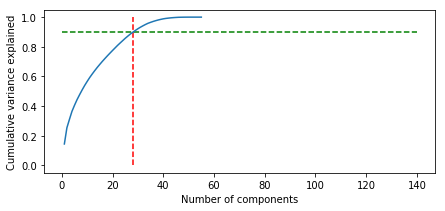

In [81]:
#Scree plot for the explained variance
var_cumu = np.cumsum(pca.explained_variance_ratio_)
fig = plt.figure(figsize=[7,3])
plt.plot(range(1,len(var_cumu)+1), var_cumu)
plt.vlines(x=28, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.90, xmax=140, xmin=0, colors="g", linestyles="--")
plt.ylabel("Cumulative variance explained")
plt.xlabel("Number of components")
plt.show()

We can see from the Scree plot that approximately 90% of the variance of high value customer dataset can be explained by 28 numbers of Principal components. Therefore, we have selected 28 no. of components for performing PCA on the dataset.

#### Applying the PCA on the train set

In [82]:
# Performing PCA with 28 components
pca_final = IncrementalPCA(n_components=28)
X_train_pca = pca_final.fit_transform(X_train)
X_train_pca.shape

(34287, 28)

In [83]:
# Creating a dataframe with obtained PCs
X_train_pca1 = pd.DataFrame(X_train_pca)
X_train_pca1.columns = ['PC'+str(i) for i in range(1,29)]

# Adding Churn column to the dataframe
y_train_df=pd.DataFrame(y_train)
teldata_pca = pd.concat([X_train_pca1,y_train_df], axis = 1)
teldata_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,Churn
0,2.895493,-1.014362,1.212195,1.225903,-0.232691,1.458830,0.252075,-0.222613,0.707497,-0.137966,1.693699,0.268369,-1.096814,0.536046,-0.840065,-0.176244,0.124885,0.328443,0.019487,2.584146,-0.386286,0.533272,0.043101,-0.457941,-0.218357,0.363196,0.743200,-0.141512,1.0
1,-5.154911,-5.439222,1.421533,-0.980418,1.583384,-1.515060,1.608740,-1.352550,-1.939059,3.130368,0.605628,0.291147,0.325766,-1.147970,-0.369743,-1.074013,-0.024298,-1.126098,0.798628,0.126901,0.111806,1.758046,0.076242,-0.212145,0.692831,-0.119284,0.188486,0.402451,0.0
2,-3.861652,-3.153385,-1.354294,-4.560456,0.806257,-0.137648,-1.154910,0.533619,0.528395,-2.988398,0.376066,0.198435,0.521044,0.766158,-0.882553,-0.923219,-0.538836,-0.671502,0.644075,-1.165506,-0.553525,4.084012,0.098349,-0.301195,-1.239759,0.921060,-0.264254,-6.206114,0.0
3,-2.077714,0.731616,0.191795,-1.095892,1.582132,-0.496777,-1.333528,0.200980,-0.652552,-1.912118,1.320287,0.370018,-0.304121,0.796390,0.758106,-0.103427,0.343201,-1.773843,-0.083074,0.965309,-0.364166,1.148896,0.640634,0.379089,0.474370,1.059221,-0.134861,-1.080867,0.0
4,-0.293433,-0.872694,1.934594,-1.135177,-1.245492,-0.324704,-0.628031,0.820090,-0.220260,-0.164186,-0.826571,0.694495,1.381163,-3.802709,1.636958,-0.276931,-3.605982,-2.133746,-0.874634,1.939747,2.651365,0.528638,0.342979,1.802118,-1.086147,-2.341954,0.819702,-0.075781,0.0


#### Applying the PCA transformation on the test set

In [84]:
# Applying the PCA transformation on the test set
X_test_pca = pca_final.transform(X_test)
X_test_pca.shape

(14695, 28)

## logistic regression Model on Principal components data

We will build Logistic regression model first as this is simple and easily interpretable model.

In [85]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

# Running the logistic regression model
model_pca = logreg.fit(X_train_pca, y_train)

In [86]:
# Getting the predicted values on the train set
y_train_pred = pd.DataFrame({'Churned':y_train, 'Churning_Prob':model_pca.predict_proba(X_train_pca)[:,1]})
y_train_pred.head()

,Churned,Churning_Prob
44190,1,0.913390
16280,0,0.004415
24229,0,0.011281
8383,0,0.019931
3339,0,0.162878


### Plotting the ROC Curve

An ROC curve see the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity)

In [87]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [88]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred.Churned, y_train_pred.Churning_Prob, drop_intermediate = False )

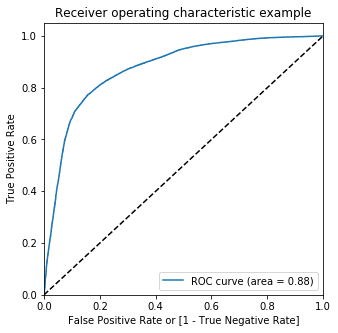

In [89]:
draw_roc(y_train_pred.Churned, y_train_pred.Churning_Prob)

In [90]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred[i]= y_train_pred.Churning_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred.head()

,Churned,Churning_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
44190,1,0.913390,1,1,1,1,1,1,1,1,1,1
16280,0,0.004415,1,0,0,0,0,0,0,0,0,0
24229,0,0.011281,1,0,0,0,0,0,0,0,0,0
8383,0,0.019931,1,0,0,0,0,0,0,0,0,0
3339,0,0.162878,1,1,0,0,0,0,0,0,0,0


#### Plotting sensitivity, specificity and accuracy together

In [91]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred.Churned, y_train_pred[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.497565  1.000000  0.000000
0.1   0.1  0.653950  0.978664  0.332385
0.2   0.2  0.705165  0.961958  0.450862
0.3   0.3  0.744247  0.924443  0.565798
0.4   0.4  0.778837  0.880715  0.677947
0.5   0.5  0.803016  0.821630  0.784582
0.6   0.6  0.804620  0.745018  0.863644
0.7   0.7  0.778487  0.641266  0.914379
0.8   0.8  0.687783  0.420281  0.952691
0.9   0.9  0.584274  0.181653  0.982992


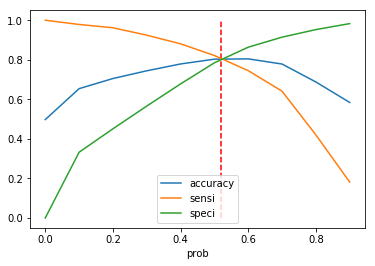

In [92]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.vlines(x=0.52, ymax=1, ymin=0, colors="r", linestyles="--")
plt.show()

### Precision and recall tradeoff

There is always a trade off between Precision & recall. We will see this trade off through precision recall curve

In [93]:
# Importing required python library

from sklearn.metrics import precision_recall_curve

#### Plotting the precision recall curve

In [94]:
p, r, thresholds = precision_recall_curve(y_train_pred.Churned, y_train_pred.Churning_Prob)

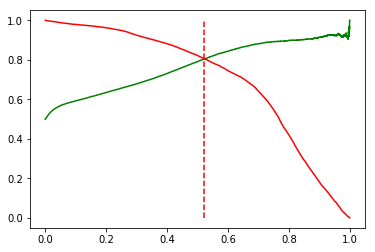

In [95]:
plt.plot(thresholds, p[:-1], "g-") # precision
plt.plot(thresholds, r[:-1], "r-") # recall
plt.vlines(x=0.52, ymax=1, ymin=0, colors="r", linestyles="--")
plt.show()

From the 'sensitivity, specificity and accuracy' graph & 'precision recall' curve we see that the optimum cutoff is 52%. Now we see the confusion matrix for test data

In [96]:
y_train_pred['predicted_churn'] = y_train_pred.Churning_Prob.map(lambda x: 1 if x > 0.52 else 0)

# Let's see the head
y_train_pred.head()

,Churned,Churning_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,predicted_churn
44190,1,0.913390,1,1,1,1,1,1,1,1,1,1,1
16280,0,0.004415,1,0,0,0,0,0,0,0,0,0,0
24229,0,0.011281,1,0,0,0,0,0,0,0,0,0,0
8383,0,0.019931,1,0,0,0,0,0,0,0,0,0,0
3339,0,0.162878,1,1,0,0,0,0,0,0,0,0,0


### Model Evaluation

####  We will Important metrics that are essential to evaluate the performance of a Classification model on train & test data
* Accuracy
* Sensitivity & Specificity
* Precision & Recall
* F1 score

In this business problem, we would to predict the high value customers who are high risk of churn. Therefore, we shall try to get high value of Recall. However, There is a trade off in recall and precision, as we increase the Recall and precision will decrease. So we will select the optimum value of Churning probability cutoff such that Precision and recall both are as high as possible. Therefore, we will use evaluation metric 'F1 score' for model evaluation.


In [97]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred['Churned'],y_train_pred['predicted_churn'] )
print(confusion)

[[13846  3381]
 [ 3299 13761]]


In [98]:
# Defining True & False positive & negative from confusion matrix
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [99]:
# Calculating the Accuracy of the model
(TP+TN)/(TP+TN+FP+FN)

0.8051739726426925

In [100]:
# Calculating the sensitivity of the model
TP / float(TP+FN)

0.8066236811254396

In [101]:
# Calculating specificity
TN / float(TN+FP)

0.8037383177570093

In [102]:
# Calculating the Precision of the model
precision=TP/float(FP+TP)
precision

0.8027651382569129

In [103]:
# Calculating the Recall of the model
recall=TP / float(TP+FN)
recall

0.8066236811254396

In [104]:
# Calculating the F-1 score of the model
F1_score= 2 * (precision * recall) / (precision + recall)
F1_score

0.8046897842231449

#### Making predictions on the test set

In [105]:
# Getting the predicted values on the test set
y_test_pred = pd.DataFrame({'Churned':y_test, 'Churning_Prob':model_pca.predict_proba(X_test_pca)[:,1]})
y_test_pred.head()

,Churned,Churning_Prob
27650,1,0.800852
8525,0,0.006148
46050,1,0.431113
12003,0,0.377513
17035,0,0.023667


In [106]:
y_test_pred['predicted_churn'] = y_test_pred.Churning_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_test_pred.head()

,Churned,Churning_Prob,predicted_churn
27650,1,0.800852,1
8525,0,0.006148,0
46050,1,0.431113,0
12003,0,0.377513,0
17035,0,0.023667,0


In [107]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_test_pred['Churned'],y_test_pred['predicted_churn'] )
print(confusion)

[[5681 1583]
 [1352 6079]]


In [108]:
# Defining True & False positive & negative from confusion matrix
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [109]:
# Calculating the Accuracy of the model
(TP+TN)/(TP+TN+FP+FN)

0.8002722014290575

In [110]:
# Calculating the sensitivity of the model
TP / float(TP+FN)

0.8180594805544341

In [111]:
# Calculating specificity
TN / float(TN+FP)

0.7820759911894273

In [112]:
# Calculating the Precision of the model
precision=TP/float(FP+TP)
precision

0.7933959801618377

In [113]:
# Calculating the Recall of the model
recall=TP / float(TP+FN)
recall

0.8180594805544341

In [114]:
# Calculating the F-1 score of the model
F1_score= 2 * (precision * recall) / (precision + recall)
F1_score

0.8055389915855034

<b> For Logistic regression model, we get F1_score of 0.80 and precision & recall also approx. 0.80. 

We will now build following more complex models to improve the prediction and see if we can get higher F1_score (higher precision & recall values)
- Decision Trees
- Random forest
- Boosting algorithm based model (Xgboost)


## Decision Tree Model on Principal components data

In [115]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

In [116]:
# Importing required libraries for Grid search
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

#### Hyperparameter Tuning

In [117]:
## GridSearchCV to find optimal max_depth

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(1, 25)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
grid_search = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True,n_jobs=-1)
grid_search.fit(X_train_pca,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=100,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'max_depth': range(1, 25)}, pre_dispatch='2*n_jobs',
   

In [118]:
# scores of GridSearch CV
scores = grid_search.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_max_depth,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,0.254398,0.004801,0.770409,0.771036,1,{'max_depth': 1},24,0.762759,0.771957,0.771070,0.771118,0.781683,0.768465,0.769433,0.771528,0.767099,0.772111,0.009668,0.001595,0.006292,0.001331
1,0.404795,0.004001,0.784729,0.786041,2,{'max_depth': 2},23,0.780840,0.787998,0.782152,0.787123,0.793933,0.783813,0.786787,0.785563,0.779933,0.785709,0.006879,0.000004,0.005171,0.001435
2,0.582394,0.004799,0.788316,0.790205,3,{'max_depth': 3},22,0.784485,0.792045,0.785798,0.791243,0.799475,0.786584,0.788537,0.790448,0.783287,0.790704,0.008234,0.001595,0.005846,0.001891
3,0.738388,0.003202,0.797299,0.802418,4,{'max_depth': 4},21,0.797463,0.805826,0.797025,0.803529,0.807350,0.801896,0.793933,0.798760,0.790725,0.802078,0.030841,0.001601,0.005580,0.002307
4,0.893580,0.004006,0.804999,0.812050,5,{'max_depth': 5},20,0.801108,0.815341,0.799504,0.810565,0.819017,0.812869,0.804725,0.809807,0.800642,0.811666,0.034744,0.000002,0.007224,0.001944


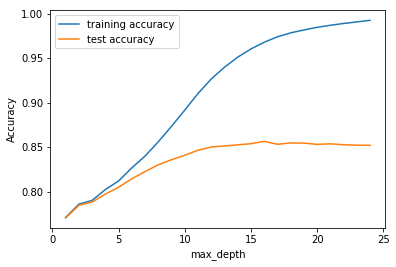

In [119]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

Comment: We see that the accruacy on the train data set starts falling when max depth reaches aroud 4 when comapred to train data set.

In [120]:
# GridSearchCV to find optimal min_samples_leaf

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
grid_search = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",return_train_score=True,n_jobs=-1)
grid_search.fit(X_train_pca,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=100,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'min_samples_leaf': range(5, 200, 20)},
             pre

In [121]:
# scores of GridSearch CV
scores = grid_search.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_min_samples_leaf,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,2.222375,0.005606,0.843002,0.949179,5,{'min_samples_leaf': 5},1,0.838728,0.950162,0.844853,0.948376,0.847455,0.949945,0.840163,0.948633,0.843809,0.948779,0.047168,0.001959,0.003169,0.000729
1,1.756780,0.004007,0.833290,0.878124,25,{'min_samples_leaf': 25},2,0.824293,0.877830,0.831584,0.879070,0.840163,0.877105,0.835642,0.878418,0.834767,0.878199,0.045429,0.000003,0.005269,0.000650
2,1.641585,0.005603,0.831015,0.858387,45,{'min_samples_leaf': 45},3,0.828230,0.861388,0.830854,0.857997,0.834622,0.856325,0.832142,0.857856,0.829226,0.858367,0.053463,0.001961,0.002248,0.001655
3,1.557588,0.004004,0.823607,0.847501,65,{'min_samples_leaf': 65},4,0.822543,0.850669,0.821376,0.848664,0.830101,0.847102,0.822225,0.845097,0.821788,0.845972,0.036271,0.000002,0.003271,0.001983
4,1.461585,0.004805,0.820165,0.840472,85,{'min_samples_leaf': 85},5,0.818898,0.841700,0.815252,0.839404,0.829663,0.838899,0.824267,0.841123,0.812746,0.841232,0.046065,0.001601,0.006129,0.001107


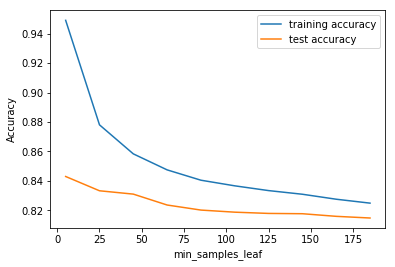

In [122]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

Comment: We can see that the train and test accruacy becomes steady and minimum when the min_sample_leaf value reaches around 130.

In [123]:
# GridSearchCV to find optimal min_samples_split

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(10, 300, 20)}

# instantiate the model
dtree = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
grid_search = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",return_train_score=True,n_jobs=-1)
grid_search.fit(X_train_pca,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=100,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'min_samples_split': range(10, 300, 20)},
             p

In [124]:
# scores of GridSearch CV
scores = grid_search.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_min_samples_split,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,2.487981,0.005603,0.844256,0.974101,10,{'min_samples_split': 10},1,0.835375,0.973969,0.846311,0.974407,0.846726,0.973934,0.845268,0.972876,0.847601,0.975319,0.065629,0.001958,0.004504,0.000790
1,2.445579,0.006402,0.837169,0.932700,30,{'min_samples_split': 30},2,0.831584,0.931642,0.840332,0.932954,0.835934,0.934378,0.840163,0.932483,0.837830,0.932045,0.144413,0.001957,0.003229,0.000946
2,2.418382,0.004802,0.834456,0.910243,50,{'min_samples_split': 50},3,0.828959,0.911335,0.834062,0.909111,0.838559,0.911958,0.834622,0.909260,0.836080,0.909552,0.080898,0.001600,0.003158,0.001171
3,2.500781,0.006406,0.832969,0.896185,70,{'min_samples_split': 70},4,0.825314,0.898246,0.835521,0.894564,0.837392,0.897703,0.835497,0.896354,0.831121,0.894058,0.122463,0.001958,0.004347,0.001657
4,2.403184,0.006404,0.831744,0.886371,90,{'min_samples_split': 90},5,0.825022,0.888585,0.832750,0.882314,0.837976,0.887240,0.834622,0.888334,0.828351,0.885381,0.310109,0.001958,0.004579,0.002322


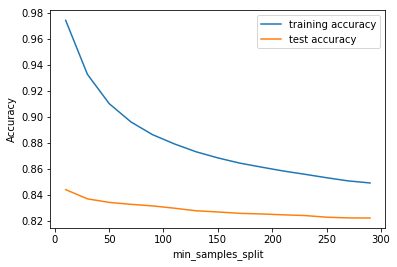

In [125]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

Comment: We can see that the train and test accruacy becomes steady and minimum when the min_sample_split value reaches around 250.

### Grid Search to Find Optimal Hyperparameters

In [126]:
# GridSearchCV to find optimal hyperparameters

# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 20, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(100, 200, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 4

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1, scoring='f1', n_jobs=-1)

# Fit the grid search to the data
grid_search.fit(X_train_pca,y_train)

Fitting 4 folds for each of 24 candidates, totalling 96 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done  96 out of  96 | elapsed:   38.1s finished


GridSearchCV(cv=4, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                     

In [127]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,mean_score_time,mean_test_score,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,rank_test_score,split0_test_score,split1_test_score,split2_test_score,split3_test_score,std_fit_time,std_score_time,std_test_score
0,1.538983,0.012001,0.797165,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",22,0.803619,0.789681,0.803419,0.791940,0.029455,0.002827,0.006405
1,1.373995,0.010996,0.797303,entropy,5,50,150,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",21,0.803619,0.790236,0.803419,0.791940,0.009164,0.003309,0.006245
2,1.310981,0.007999,0.796921,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",23,0.803594,0.790236,0.802666,0.791190,0.005927,0.000005,0.006227
3,1.470736,0.012502,0.796921,entropy,5,100,150,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",23,0.803594,0.790236,0.802666,0.791190,0.037327,0.004328,0.006227
4,2.177766,0.009003,0.822959,entropy,10,50,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",4,0.817060,0.825629,0.821636,0.827513,0.016191,0.001730,0.004013
5,2.179974,0.009005,0.822609,entropy,10,50,150,"{'criterion': 'entropy', 'max_depth': 10, 'min...",6,0.816484,0.825157,0.822084,0.826711,0.018975,0.001732,0.003909
6,2.050984,0.010005,0.819872,entropy,10,100,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",10,0.815548,0.818536,0.828874,0.816531,0.031541,0.001998,0.005308
7,2.019986,0.010001,0.819743,entropy,10,100,150,"{'criterion': 'entropy', 'max_depth': 10, 'min...",12,0.815548,0.818021,0.828874,0.816531,0.025137,0.002003,0.005345
8,2.342978,0.010003,0.825876,entropy,15,50,100,"{'criterion': 'entropy', 'max_depth': 15, 'min...",1,0.818490,0.827931,0.824383,0.832699,0.034917,0.002002,0.005186
9,2.334979,0.010004,0.824663,entropy,15,50,150,"{'criterion': 'entropy', 'max_depth': 15, 'min...",2,0.817387,0.826087,0.824654,0.830522,0.086318,0.001996,0.004725


In [128]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.8258755781808453
DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=15, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=100,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


Running the model with best parameters obtained from grid search.

In [129]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(criterion = "entropy", 
                                  random_state = 100,
                                  max_depth=15, 
                                  min_samples_leaf=50,
                                  min_samples_split=100)
clf_gini.fit(X_train_pca, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=15, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=100,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=100, splitter='best')

In [130]:
# classification metrics
from sklearn.metrics import classification_report,confusion_matrix

In [131]:
# making prediction on train set
y_train_pred_dt = clf_gini.predict(X_train_pca)
print(classification_report(y_train, y_train_pred_dt))

              precision    recall  f1-score   support

           0       0.88      0.85      0.86     17227
           1       0.85      0.88      0.86     17060

    accuracy                           0.86     34287
   macro avg       0.86      0.86      0.86     34287
weighted avg       0.86      0.86      0.86     34287



In [132]:
# accuracy score
clf_gini.score(X_test_pca,y_test)

0.8318475671997277

#### Making predictions on the test set

In [133]:
y_test_pred_dt = clf_gini.predict(X_test_pca)
print(classification_report(y_test, y_test_pred_dt))

              precision    recall  f1-score   support

           0       0.84      0.81      0.83      7264
           1       0.82      0.85      0.84      7431

    accuracy                           0.83     14695
   macro avg       0.83      0.83      0.83     14695
weighted avg       0.83      0.83      0.83     14695



In [134]:
# confusion matrix
confusion = metrics.confusion_matrix(y_test,y_test_pred_dt)
print(confusion)
TN = confusion[0, 0]
FP = confusion[0, 1]
FN = confusion[1, 0]
TP = confusion[1, 1]

[[5886 1378]
 [1093 6338]]


In [135]:
recall = TP / float(FN + TP)
print("sensitivity/ recall:  ",recall)
specificity = TN / float(TN + FP)
print("specificity:  ",specificity)
precision = TP / float(TP + FP)
print("precision:  ",precision)

# Calculating the F-1 score of the model
F1_score= 2 * (precision * recall) / (precision + recall)
print("F1_score:  ",F1_score)

sensitivity/ recall:   0.8529134705961513
specificity:   0.8102973568281938
precision:   0.821410057024365
F1_score:   0.8368653858849936


In [136]:
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz


# Putting features
features = list(X_train_pca1.columns)

In [137]:
# plotting tree
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,
                feature_names=features, filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

<b> We see that the recall and the F1 score have improved in Decision Tree model as compoare to the logistic regression. We shall look for Random forest model to see if there is improvement in the recall/F1 scores. 

## Random Forest Model on Principal components data

In [138]:
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier

#### Hyperparameter tunning

In [139]:
# GridSearchCV to find optimal max depth

# specify number of folds for k-fold CV
n_folds = 3

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 5)}

# instantiate the model
rf = RandomForestClassifier()


# fit random forest on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="f1", return_train_score=True,n_jobs=-1 )

rf.fit(X_train_pca, y_train)

GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [140]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_max_depth,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,5.098636,0.156008,0.789179,0.790795,2,{'max_depth': 2},4,0.785956,0.791646,0.798222,0.790195,0.783359,0.790545,0.017989,0.003266,0.006482,0.000618
1,12.216372,0.202669,0.826782,0.839197,7,{'max_depth': 7},3,0.822393,0.841387,0.833570,0.836243,0.824382,0.839963,0.361692,0.012364,0.004868,0.002169
2,17.398513,0.309333,0.878715,0.934181,12,{'max_depth': 12},2,0.872530,0.934223,0.886699,0.933045,0.876915,0.935274,0.105530,0.034922,0.005923,0.000911
3,18.607858,0.265344,0.909118,0.980480,17,{'max_depth': 17},1,0.904944,0.979401,0.913900,0.981038,0.908510,0.981000,2.012565,0.025359,0.003682,0.000763


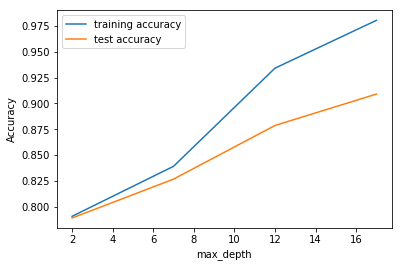

In [141]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

We can see that Difference between the train and test accuracy starts widening as the depth is increased.

In [142]:
# GridSearchCV to find optimal min_samples_leaf

# specify number of folds for k-fold CV
n_folds = 3

# parameters to build the model on
parameters = {'min_samples_leaf': range(50, 250, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit random forest on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="f1", return_train_score=True,n_jobs=-1 )

rf.fit(X_train_pca, y_train)

GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [143]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_min_samples_leaf,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,15.582766,0.250666,0.841919,0.857856,50,{'min_samples_leaf': 50},1,0.837300,0.860367,0.849766,0.854075,0.838693,0.859125,0.024514,0.001885,0.005577,0.002721
1,14.046543,0.237334,0.828477,0.838940,100,{'min_samples_leaf': 100},2,0.823373,0.840786,0.835081,0.835835,0.826977,0.840199,0.228524,0.016762,0.004896,0.002208
2,13.086033,0.222672,0.823672,0.830470,150,{'min_samples_leaf': 150},3,0.819443,0.831448,0.830289,0.827806,0.821283,0.832157,0.101991,0.006801,0.004739,0.001906
3,12.259925,0.191998,0.817534,0.824862,200,{'min_samples_leaf': 200},4,0.815005,0.828700,0.822933,0.820795,0.814664,0.825092,0.134146,0.037666,0.003820,0.003231


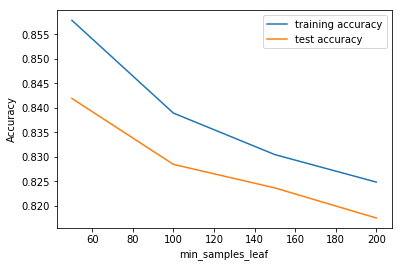

In [144]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

We can see that difference between the train and the test accuracy is steady and minimum when the min_sample_leaf value reaches 100 and is the difference remains almost steady thereafter.

In [145]:
# GridSearchCV to find optimal min_samples_split

# specify number of folds for k-fold CV
n_folds = 3

# parameters to build the model on
parameters = {'min_samples_split': range(25, 200, 25)}

# instantiate the model
rf = RandomForestClassifier()


# fit random forest on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="f1", return_train_score=True,n_jobs=-1 )

rf.fit(X_train_pca, y_train)

GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [146]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_min_samples_split,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,21.805115,0.353338,0.888556,0.956466,25,{'min_samples_split': 25},1,0.882488,0.955953,0.894351,0.957984,0.888830,0.955461,0.131767,0.001889,0.004847,0.001092
1,21.045340,0.423999,0.871564,0.923056,50,{'min_samples_split': 50},2,0.866108,0.923691,0.877513,0.924260,0.871071,0.921217,0.152498,0.094761,0.004669,0.001321
2,20.702299,0.366896,0.862178,0.901470,75,{'min_samples_split': 75},3,0.857015,0.903309,0.868947,0.899742,0.860571,0.901358,0.440955,0.057623,0.005002,0.001459
3,20.078177,0.299997,0.857094,0.888214,100,{'min_samples_split': 100},4,0.853624,0.890216,0.862997,0.886082,0.854663,0.888345,0.370674,0.000001,0.004195,0.001690
4,19.244240,0.313337,0.851134,0.877830,125,{'min_samples_split': 125},5,0.845309,0.879126,0.858316,0.874072,0.849778,0.880292,0.225293,0.037714,0.005396,0.002699


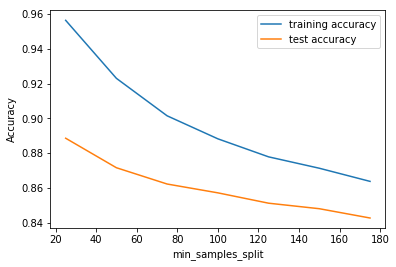

In [147]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

The train and test accuracy becomes steady and minimum when the min_sample_split reaches 140 and remains almost same thereafter.  

### Grid Search to Find Optimal Hyperparameters

In [148]:
# specify number of folds for k-fold CV
n_folds = 2

# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [5,10],
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'n_estimators': [100,200], 
    'max_features': [10,20]
}

# Create a based model
rf = RandomForestClassifier()

# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = n_folds, n_jobs = -1,verbose = 1, scoring='f1')

In [149]:
# Fit the grid search to the data
grid_search.fit(X_train_pca, y_train)

Fitting 2 folds for each of 32 candidates, totalling 64 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:  8.7min finished


GridSearchCV(cv=2, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [150]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.8408752853300903 using {'max_depth': 10, 'max_features': 20, 'min_samples_leaf': 50, 'min_samples_split': 50, 'n_estimators': 200}


Fitting the final model with the best parameters obtained from grid search.

In [151]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=10,
                             min_samples_leaf=50, 
                             min_samples_split=100,
                             max_features=20,
                             n_estimators=100)

In [152]:
# fit
rfc.fit(X_train_pca,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features=20,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=100,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [153]:
# predict
y_train_pred_rf = rfc.predict(X_train_pca)

In [154]:
# evaluation metrics
from sklearn.metrics import classification_report,confusion_matrix

In [155]:
print(classification_report(y_train,y_train_pred_rf))

              precision    recall  f1-score   support

           0       0.87      0.86      0.87     17227
           1       0.86      0.87      0.87     17060

    accuracy                           0.87     34287
   macro avg       0.87      0.87      0.87     34287
weighted avg       0.87      0.87      0.87     34287



#### Making predictions on the test set

In [156]:
# predict
y_test_pred_rf = rfc.predict(X_test_pca)

In [157]:
print(classification_report(y_test,y_test_pred_rf))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85      7264
           1       0.85      0.85      0.85      7431

    accuracy                           0.85     14695
   macro avg       0.85      0.85      0.85     14695
weighted avg       0.85      0.85      0.85     14695



In [158]:
# confusion matrix
confusion = metrics.confusion_matrix(y_test,y_test_pred_rf)
print(confusion)
TN = confusion[0, 0]
FP = confusion[0, 1]
FN = confusion[1, 0]
TP = confusion[1, 1]

[[6150 1114]
 [1126 6305]]


In [159]:
recall = TP / float(FN + TP)
print("sensitivity/ recall:  ",recall)
specificity = TN / float(TN + FP)
print("specificity:  ",specificity)
precision = TP / float(TP + FP)
print("precision:  ",precision)

# Calculating the F-1 score of the model
F1_score= 2 * (precision * recall) / (precision + recall)
print("F1_score:  ",F1_score)

sensitivity/ recall:   0.8484726147221101
specificity:   0.8466409691629956
precision:   0.849844992586602
F1_score:   0.8491582491582492


<b> We see that the recall and the F1 score have improved further in Random Forest model as compoare to Decision Tree and logistic regression models. We shall look for XgBoost model to see if there is improvement in the recall/F1 scores.

## Xgboost Model on Principal components data

In [160]:
# Importing XGboost classifier

import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance

### Grid Search to Find Optimal Hyperparameters

In [161]:
# hyperparameter tuning with XGBoost

# creating a KFold object 
folds = 3

# specify range of hyperparameters
param_grid = {'learning_rate': [0.01, 0.1, 0.3, 0.5], 
             'subsample': [0.3, 0.6, 0.9]}          


# specify model
xgb_model = XGBClassifier(max_depth=2, n_estimators=200)

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = xgb_model, 
                        param_grid = param_grid, 
                        scoring= 'f1', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True, n_jobs=-1)      

In [162]:
# fit the model
model_cv.fit(X_train_pca, y_train)  

Fitting 3 folds for each of 12 candidates, totalling 36 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  36 out of  36 | elapsed:  2.8min finished


GridSearchCV(cv=3, error_score=nan,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=2, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimato...
                                     objective='binary:logistic',
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, scale_pos_weight=None,
                                     subsample=None, tree_method=Non

In [163]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_learning_rate,param_subsample,params,rank_test_score,split0_test_score,split0_train_score,split1_test_score,split1_train_score,split2_test_score,split2_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,13.880781,0.096666,0.798279,0.799529,0.01,0.3,"{'learning_rate': 0.01, 'subsample': 0.3}",10,0.794428,0.801450,0.805468,0.795338,0.794941,0.801797,0.039204,4.714378e-03,0.005088,0.002966
1,18.602695,0.090002,0.798074,0.799690,0.01,0.6,"{'learning_rate': 0.01, 'subsample': 0.6}",12,0.793913,0.801900,0.806274,0.796089,0.794036,0.801082,0.179568,1.634140e-03,0.005798,0.002568
2,21.627819,0.088668,0.798137,0.799814,0.01,0.9,"{'learning_rate': 0.01, 'subsample': 0.9}",11,0.793377,0.801956,0.806925,0.796405,0.794110,0.801082,0.119277,6.601818e-03,0.006221,0.002437
3,13.674865,0.108667,0.838643,0.845555,0.1,0.3,"{'learning_rate': 0.1, 'subsample': 0.3}",8,0.830571,0.847403,0.847965,0.841287,0.837392,0.847976,0.106281,3.397557e-03,0.007156,0.003027
4,18.030348,0.120001,0.839667,0.846046,0.1,0.6,"{'learning_rate': 0.1, 'subsample': 0.6}",7,0.833774,0.849463,0.848103,0.841231,0.837124,0.847443,0.081887,2.550900e-02,0.006120,0.003503
5,21.414109,0.120001,0.838355,0.846130,0.1,0.9,"{'learning_rate': 0.1, 'subsample': 0.9}",9,0.832055,0.847825,0.848018,0.842521,0.834992,0.848045,0.365925,2.550848e-02,0.006937,0.002554
6,14.076129,0.123332,0.849231,0.867655,0.3,0.3,"{'learning_rate': 0.3, 'subsample': 0.3}",6,0.844608,0.866839,0.856119,0.864471,0.846965,0.871654,0.385768,2.322329e-02,0.004965,0.002988
7,18.550026,0.140001,0.855267,0.871494,0.3,0.6,"{'learning_rate': 0.3, 'subsample': 0.6}",3,0.850948,0.874716,0.863382,0.866159,0.851470,0.873606,0.336969,2.160083e-02,0.005743,0.003799
8,21.193031,0.104002,0.853458,0.870205,0.3,0.9,"{'learning_rate': 0.3, 'subsample': 0.9}",4,0.848191,0.872114,0.862196,0.867454,0.849987,0.871047,0.051062,3.265555e-03,0.006222,0.001993
9,13.528153,0.110002,0.849348,0.876369,0.5,0.3,"{'learning_rate': 0.5, 'subsample': 0.3}",5,0.848432,0.879418,0.853665,0.873349,0.845946,0.876340,0.190491,8.485379e-07,0.003217,0.002478


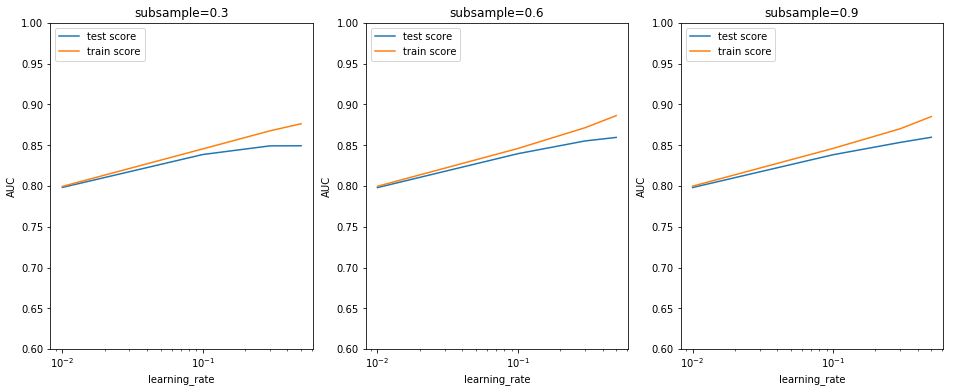

In [164]:
# # plotting
plt.figure(figsize=(16,6))

param_grid = {'learning_rate': [0.01, 0.1, 0.3, 0.5], 
             'subsample': [0.3, 0.6, 0.9]} 

for n, subsample in enumerate(param_grid['subsample']):
    
    # subplot 1/n
    plt.subplot(1,len(param_grid['subsample']), n+1)
    df = cv_results[cv_results['param_subsample']==subsample]

    plt.plot(df["param_learning_rate"], df["mean_test_score"])
    plt.plot(df["param_learning_rate"], df["mean_train_score"])
    plt.xlabel('learning_rate')
    plt.ylabel('AUC')
    plt.title("subsample={0}".format(subsample))
    plt.ylim([0.60, 1])
    plt.legend(['test score', 'train score'], loc='upper left')
    plt.xscale('log')

The results show that a subsample size of 0.6 and learning_rate of about 0.1 is optimal. 

Building a final model with the chosen hyperparameters.

In [165]:
# chosen hyperparameters
# 'objective':'binary:logistic' outputs probability rather than label, which we need for auc
params = {'learning_rate': 0.1,
          'max_depth': 2, 
          'n_estimators':200,
          'subsample':0.9,
         'objective':'binary:logistic'}

# fit model on training data
model_xgb = XGBClassifier(params = params)
model_xgb.fit(X_train_pca, y_train)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic',
              params={'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 200,
                      'objective': 'binary:logistic', 'subsample': 0.9},
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method=None, validate_parameters=False,
              verbosity=None)

In [166]:
# predict on train set
y_train_pred_xgb = model_xgb.predict(X_train_pca)

In [167]:
# evaluation metrics
from sklearn.metrics import classification_report,confusion_matrix

In [168]:
print(classification_report(y_train,y_train_pred_xgb))

              precision    recall  f1-score   support

           0       0.98      0.97      0.97     17227
           1       0.97      0.98      0.98     17060

    accuracy                           0.98     34287
   macro avg       0.98      0.98      0.98     34287
weighted avg       0.98      0.98      0.98     34287



#### Making predictions on the test set

In [169]:
# predict
y_test_pred_xgb = model_xgb.predict(X_test_pca)

In [170]:
print(classification_report(y_test,y_test_pred_xgb))

              precision    recall  f1-score   support

           0       0.94      0.90      0.92      7264
           1       0.91      0.94      0.92      7431

    accuracy                           0.92     14695
   macro avg       0.92      0.92      0.92     14695
weighted avg       0.92      0.92      0.92     14695



In [171]:
# Checking probabilities
y_test_pred_xg_prob = model_xgb.predict_proba(X_test_pca)

In [172]:
# roc_auc
auc = metrics.roc_auc_score(y_test, y_test_pred_xg_prob[:, 1])
auc

0.9709611835642683

In [173]:
# confusion matrix
confusion = metrics.confusion_matrix(y_test,y_test_pred_xgb)
print(confusion)
TN = confusion[0, 0]
FP = confusion[0, 1]
FN = confusion[1, 0]
TP = confusion[1, 1]

[[6534  730]
 [ 450 6981]]


In [174]:
recall = TP / float(FN + TP)
print("sensitivity/ recall:  ",recall)
specificity = TN / float(TN + FP)
print("specificity:  ",specificity)
precision = TP / float(TP + FP)
print("precision:  ",precision)

# Calculating the F-1 score of the model
F1_score= 2 * (precision * recall) / (precision + recall)
print("F1_score:  ",F1_score)

sensitivity/ recall:   0.939442874444893
specificity:   0.8995044052863436
precision:   0.9053300479834003
F1_score:   0.9220710606260731


#### We see that the recall and the F1 score have improved further in Xgboost model model. Therefore we can say that Xgboost Model performs the best among Logistic regression model, Decision Tree model, Random Forest model and Xgboost model.

# Model with objective of identifying important predictor 

Logistic regression is good in terms of interpretability of model where we can see the most important features affecting the prediction. Therefore, we will build Logistic regression model on original features to see the most important features affecting churn prediction.

## Logistic regression model on original features

In [175]:
# Running the logistic regression model
logreg = LogisticRegression()

In [176]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 15)             # running RFE with 15 variables as output
rfe = rfe.fit(X_train, y_train)

In [177]:
col = X_train.columns[rfe.support_]
col

Index(['fb_user_8', 'aon', 'onnet_mou_diff', 'loc_og_t2m_mou_diff',
       'loc_og_mou_diff', 'std_og_t2t_mou_diff', 'std_og_t2m_mou_diff',
       'std_og_mou_diff', 'loc_ic_t2t_mou_diff', 'loc_ic_t2m_mou_diff',
       'loc_ic_t2f_mou_diff', 'loc_ic_mou_diff', 'std_ic_t2m_mou_diff',
       'total_ic_mou_diff', 'total_rech_amt_diff'],
      dtype='object')

#### Assessing the model with StatsModels

In [178]:
import statsmodels.api as sm

In [179]:
X_train_stat = sm.add_constant(X_train[col])
logm = sm.GLM(y_train,X_train_stat, family = sm.families.Binomial())
res = logm.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                34287
Model:                            GLM   Df Residuals:                    34271
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -15114.
Date:                Mon, 16 Mar 2020   Deviance:                       30228.
Time:                        20:06:46   Pearson chi2:                 7.63e+04
No. Iterations:                     6   Covariance Type:             nonrobust
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.0327      0.017     -1.887      0.059      -0.067       0.001
fb_user_8              -1.0000      0.023    -43.247      0.000      -1.045      -0.955
aon                    -0.4436      0.015    -29.123      0.000      -0.473      -0.414
onnet_mou_diff         -1.1073      0.134     -8.287      0.000      -1.369      -0.845
loc_og_t2m_mou_diff    -0.5735      0.060     -9.635      0.000      -0.690      -0.457
loc_og_mou_diff         0.6353      0.073      8.646      0.000       0.491       0.779
std_og_t2t_mou_diff     2.5445      0.221     11.538      0.000       2.112       2.977
std_og_t2m_mou_diff     1.5465      0.175      8.861      0.000       1.204       1.889
std_og_mou_diff        -1.8417      0.254     -7.253      0.000      -2.339      -1.344
loc_ic_t2t_mou_diff    -1.1698      0.043    -26.905      0.000      -1.255      -1.085
loc_ic_t2m_mou_diff    -2.0156      0.071    -28.547      0.000      -2.154      -1.877
loc_ic_t2f_mou_diff    -0.4188      0.021    -20.249      0.000      -0.459      -0.378
loc_ic_mou_diff         1.1067      0.068     16.264      0.000       0.973       1.240
std_ic_t2m_mou_diff    -0.4631      0.022    -21.482      0.000      -0.505      -0.421
total_ic_mou_diff       2.2531      0.065     34.864      0.000       2.126       2.380
total_rech_amt_diff     0.6695      0.027     25.176      0.000       0.617       0.722
=======================================================================================
"""

In [180]:
y_train_pred = res.predict(X_train_stat).values.reshape(-1)

In [181]:
y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churning_Prob':y_train_pred})
y_train_pred_final.head()

,Churn,Churning_Prob
0,1,0.825165
1,0,0.014193
2,0,0.055487
3,0,0.017537
4,0,0.173225


In [182]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churning_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churning_Prob,predicted
0,1,0.825165,1
1,0,0.014193,0
2,0,0.055487,0
3,0,0.017537,0
4,0,0.173225,0


In [183]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.808148861084376


#### Checking VIFs

In [184]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [185]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,std_og_t2t_mou_diff,124.26
7,std_og_mou_diff,85.48
2,onnet_mou_diff,81.07
6,std_og_t2m_mou_diff,40.86
4,loc_og_mou_diff,24.32
3,loc_og_t2m_mou_diff,15.96
11,loc_ic_mou_diff,13.05
9,loc_ic_t2m_mou_diff,10.01
13,total_ic_mou_diff,5.39
8,loc_ic_t2t_mou_diff,4.72


There are a few variables with high VIF. It's best to drop these variables as they aren't helping much with prediction and unnecessarily making the model complex. The variable 'std_og_t2t_mou_diff' has the highest VIF. So let's start by dropping that.

In [186]:
col = col.drop('std_og_t2t_mou_diff', 1)
col

Index(['fb_user_8', 'aon', 'onnet_mou_diff', 'loc_og_t2m_mou_diff',
       'loc_og_mou_diff', 'std_og_t2m_mou_diff', 'std_og_mou_diff',
       'loc_ic_t2t_mou_diff', 'loc_ic_t2m_mou_diff', 'loc_ic_t2f_mou_diff',
       'loc_ic_mou_diff', 'std_ic_t2m_mou_diff', 'total_ic_mou_diff',
       'total_rech_amt_diff'],
      dtype='object')

In [187]:
X_train_stat = sm.add_constant(X_train[col])
logm1 = sm.GLM(y_train,X_train_stat, family = sm.families.Binomial())
res = logm1.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                34287
Model:                            GLM   Df Residuals:                    34272
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -15179.
Date:                Mon, 16 Mar 2020   Deviance:                       30358.
Time:                        20:06:49   Pearson chi2:                 5.52e+04
No. Iterations:                     6   Covariance Type:             nonrobust
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.0333      0.017     -1.941      0.052      -0.067       0.000
fb_user_8              -1.0009      0.023    -43.319      0.000      -1.046      -0.956
aon                    -0.4420      0.015    -29.123      0.000      -0.472      -0.412
onnet_mou_diff         -0.1796      0.102     -1.767      0.077      -0.379       0.020
loc_og_t2m_mou_diff    -0.2181      0.049     -4.443      0.000      -0.314      -0.122
loc_og_mou_diff         0.1619      0.058      2.778      0.005       0.048       0.276
std_og_t2m_mou_diff    -0.1095      0.102     -1.073      0.283      -0.309       0.090
std_og_mou_diff         0.6229      0.143      4.369      0.000       0.343       0.902
loc_ic_t2t_mou_diff    -1.1515      0.044    -26.219      0.000      -1.238      -1.065
loc_ic_t2m_mou_diff    -1.9773      0.071    -27.661      0.000      -2.117      -1.837
loc_ic_t2f_mou_diff    -0.4107      0.021    -19.834      0.000      -0.451      -0.370
loc_ic_mou_diff         1.0241      0.068     15.081      0.000       0.891       1.157
std_ic_t2m_mou_diff    -0.4728      0.022    -21.820      0.000      -0.515      -0.430
total_ic_mou_diff       2.3169      0.065     35.801      0.000       2.190       2.444
total_rech_amt_diff     0.6184      0.026     23.782      0.000       0.567       0.669
=======================================================================================
"""

In [188]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,std_og_mou_diff,49.89
5,std_og_t2m_mou_diff,25.62
2,onnet_mou_diff,24.52
10,loc_ic_mou_diff,12.29
8,loc_ic_t2m_mou_diff,9.39
4,loc_og_mou_diff,8.77
3,loc_og_t2m_mou_diff,6.98
12,total_ic_mou_diff,5.39
7,loc_ic_t2t_mou_diff,4.53
13,total_rech_amt_diff,2.56


The variable 'std_og_t2m_mou_diff' has the very high p value. So let's dropp that.

In [189]:
col = col.drop('std_og_t2m_mou_diff', 1)
col

Index(['fb_user_8', 'aon', 'onnet_mou_diff', 'loc_og_t2m_mou_diff',
       'loc_og_mou_diff', 'std_og_mou_diff', 'loc_ic_t2t_mou_diff',
       'loc_ic_t2m_mou_diff', 'loc_ic_t2f_mou_diff', 'loc_ic_mou_diff',
       'std_ic_t2m_mou_diff', 'total_ic_mou_diff', 'total_rech_amt_diff'],
      dtype='object')

In [190]:
X_train_stat = sm.add_constant(X_train[col])
logm1 = sm.GLM(y_train,X_train_stat, family = sm.families.Binomial())
res = logm1.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                34287
Model:                            GLM   Df Residuals:                    34273
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -15179.
Date:                Mon, 16 Mar 2020   Deviance:                       30359.
Time:                        20:06:51   Pearson chi2:                 5.55e+04
No. Iterations:                     6   Covariance Type:             nonrobust
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.0331      0.017     -1.931      0.054      -0.067       0.001
fb_user_8              -1.0007      0.023    -43.318      0.000      -1.046      -0.955
aon                    -0.4413      0.015    -29.113      0.000      -0.471      -0.412
onnet_mou_diff         -0.0745      0.028     -2.699      0.007      -0.129      -0.020
loc_og_t2m_mou_diff    -0.1787      0.033     -5.475      0.000      -0.243      -0.115
loc_og_mou_diff         0.1110      0.034      3.260      0.001       0.044       0.178
std_og_mou_diff         0.4734      0.030     15.575      0.000       0.414       0.533
loc_ic_t2t_mou_diff    -1.1424      0.043    -26.530      0.000      -1.227      -1.058
loc_ic_t2m_mou_diff    -1.9599      0.070    -28.168      0.000      -2.096      -1.824
loc_ic_t2f_mou_diff    -0.4075      0.020    -19.897      0.000      -0.448      -0.367
loc_ic_mou_diff         1.0087      0.066     15.176      0.000       0.878       1.139
std_ic_t2m_mou_diff    -0.4717      0.022    -21.807      0.000      -0.514      -0.429
total_ic_mou_diff       2.3116      0.064     35.848      0.000       2.185       2.438
total_rech_amt_diff     0.6102      0.025     24.597      0.000       0.562       0.659
=======================================================================================
"""

In [191]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,loc_ic_mou_diff,12.23
7,loc_ic_t2m_mou_diff,9.34
11,total_ic_mou_diff,5.39
6,loc_ic_t2t_mou_diff,4.51
4,loc_og_mou_diff,4.23
3,loc_og_t2m_mou_diff,4.11
5,std_og_mou_diff,2.91
12,total_rech_amt_diff,2.45
2,onnet_mou_diff,2.19
8,loc_ic_t2f_mou_diff,1.38


The variable 'loc_ic_mou_diff' has the highest VIF. So let's drop that.

In [192]:
col = col.drop('loc_ic_mou_diff', 1)
col

Index(['fb_user_8', 'aon', 'onnet_mou_diff', 'loc_og_t2m_mou_diff',
       'loc_og_mou_diff', 'std_og_mou_diff', 'loc_ic_t2t_mou_diff',
       'loc_ic_t2m_mou_diff', 'loc_ic_t2f_mou_diff', 'std_ic_t2m_mou_diff',
       'total_ic_mou_diff', 'total_rech_amt_diff'],
      dtype='object')

In [193]:
X_train_stat = sm.add_constant(X_train[col])
logm1 = sm.GLM(y_train,X_train_stat, family = sm.families.Binomial())
res = logm1.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                34287
Model:                            GLM   Df Residuals:                    34274
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -15236.
Date:                Mon, 16 Mar 2020   Deviance:                       30471.
Time:                        20:06:52   Pearson chi2:                 6.00e+04
No. Iterations:                     6   Covariance Type:             nonrobust
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.0268      0.017     -1.568      0.117      -0.060       0.007
fb_user_8              -0.9997      0.023    -43.318      0.000      -1.045      -0.954
aon                    -0.4453      0.015    -29.395      0.000      -0.475      -0.416
onnet_mou_diff         -0.0643      0.028     -2.334      0.020      -0.118      -0.010
loc_og_t2m_mou_diff    -0.1424      0.032     -4.410      0.000      -0.206      -0.079
loc_og_mou_diff         0.0779      0.034      2.322      0.020       0.012       0.144
std_og_mou_diff         0.4589      0.030     15.174      0.000       0.400       0.518
loc_ic_t2t_mou_diff    -0.7122      0.028    -25.435      0.000      -0.767      -0.657
loc_ic_t2m_mou_diff    -1.2113      0.045    -26.671      0.000      -1.300      -1.122
loc_ic_t2f_mou_diff    -0.2754      0.018    -15.554      0.000      -0.310      -0.241
std_ic_t2m_mou_diff    -0.4906      0.022    -22.424      0.000      -0.533      -0.448
total_ic_mou_diff       2.3909      0.066     36.166      0.000       2.261       2.520
total_rech_amt_diff     0.6290      0.025     25.372      0.000       0.580       0.678
=======================================================================================
"""

In [194]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
10,total_ic_mou_diff,5.34
4,loc_og_mou_diff,4.19
3,loc_og_t2m_mou_diff,3.93
7,loc_ic_t2m_mou_diff,3.24
5,std_og_mou_diff,2.91
11,total_rech_amt_diff,2.44
2,onnet_mou_diff,2.19
6,loc_ic_t2t_mou_diff,1.69
9,std_ic_t2m_mou_diff,1.38
0,fb_user_8,1.10


The variable 'total_ic_mou_diff' has the high VIF. So let's drop that.

In [195]:
col = col.drop('total_ic_mou_diff', 1)
col

Index(['fb_user_8', 'aon', 'onnet_mou_diff', 'loc_og_t2m_mou_diff',
       'loc_og_mou_diff', 'std_og_mou_diff', 'loc_ic_t2t_mou_diff',
       'loc_ic_t2m_mou_diff', 'loc_ic_t2f_mou_diff', 'std_ic_t2m_mou_diff',
       'total_rech_amt_diff'],
      dtype='object')

In [196]:
X_train_stat = sm.add_constant(X_train[col])
logm1 = sm.GLM(y_train,X_train_stat, family = sm.families.Binomial())
res = logm1.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                34287
Model:                            GLM   Df Residuals:                    34275
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16312.
Date:                Mon, 16 Mar 2020   Deviance:                       32624.
Time:                        20:06:53   Pearson chi2:                 5.72e+04
No. Iterations:                     6   Covariance Type:             nonrobust
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.1769      0.016    -11.372      0.000      -0.207      -0.146
fb_user_8              -1.0346      0.023    -45.533      0.000      -1.079      -0.990
aon                    -0.4613      0.015    -31.751      0.000      -0.490      -0.433
onnet_mou_diff          0.0113      0.027      0.425      0.671      -0.041       0.063
loc_og_t2m_mou_diff     0.0501      0.028      1.765      0.078      -0.006       0.106
loc_og_mou_diff        -0.1358      0.029     -4.624      0.000      -0.193      -0.078
std_og_mou_diff         0.1723      0.029      5.989      0.000       0.116       0.229
loc_ic_t2t_mou_diff     0.0699      0.016      4.405      0.000       0.039       0.101
loc_ic_t2m_mou_diff     0.1878      0.018     10.498      0.000       0.153       0.223
loc_ic_t2f_mou_diff    -0.0365      0.015     -2.431      0.015      -0.066      -0.007
std_ic_t2m_mou_diff     0.0629      0.015      4.095      0.000       0.033       0.093
total_rech_amt_diff     1.0884      0.023     46.636      0.000       1.043       1.134
=======================================================================================
"""

p value for 'onnet_mou_diff' is high. So we will drop this feature.

In [197]:
col = col.drop('onnet_mou_diff', 1)
col

Index(['fb_user_8', 'aon', 'loc_og_t2m_mou_diff', 'loc_og_mou_diff',
       'std_og_mou_diff', 'loc_ic_t2t_mou_diff', 'loc_ic_t2m_mou_diff',
       'loc_ic_t2f_mou_diff', 'std_ic_t2m_mou_diff', 'total_rech_amt_diff'],
      dtype='object')

In [198]:
X_train_stat = sm.add_constant(X_train[col])
logm1 = sm.GLM(y_train,X_train_stat, family = sm.families.Binomial())
res = logm1.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                34287
Model:                            GLM   Df Residuals:                    34276
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16312.
Date:                Mon, 16 Mar 2020   Deviance:                       32625.
Time:                        20:06:54   Pearson chi2:                 5.72e+04
No. Iterations:                     6   Covariance Type:             nonrobust
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.1769      0.016    -11.373      0.000      -0.207      -0.146
fb_user_8              -1.0348      0.023    -45.546      0.000      -1.079      -0.990
aon                    -0.4613      0.015    -31.755      0.000      -0.490      -0.433
loc_og_t2m_mou_diff     0.0465      0.027      1.716      0.086      -0.007       0.100
loc_og_mou_diff        -0.1312      0.027     -4.799      0.000      -0.185      -0.078
std_og_mou_diff         0.1799      0.023      7.959      0.000       0.136       0.224
loc_ic_t2t_mou_diff     0.0701      0.016      4.421      0.000       0.039       0.101
loc_ic_t2m_mou_diff     0.1877      0.018     10.491      0.000       0.153       0.223
loc_ic_t2f_mou_diff    -0.0365      0.015     -2.433      0.015      -0.066      -0.007
std_ic_t2m_mou_diff     0.0625      0.015      4.074      0.000       0.032       0.092
total_rech_amt_diff     1.0893      0.023     46.870      0.000       1.044       1.135
=======================================================================================
"""

In [199]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,loc_og_mou_diff,3.87
2,loc_og_t2m_mou_diff,3.74
9,total_rech_amt_diff,2.01
4,std_og_mou_diff,1.74
6,loc_ic_t2m_mou_diff,1.25
5,loc_ic_t2t_mou_diff,1.18
0,fb_user_8,1.10
8,std_ic_t2m_mou_diff,1.08
1,aon,1.05
7,loc_ic_t2f_mou_diff,1.04


p value for 'loc_og_t2m_mou_diff' is high. So we will drop this feature.

In [200]:
col = col.drop('loc_og_t2m_mou_diff', 1)
col

Index(['fb_user_8', 'aon', 'loc_og_mou_diff', 'std_og_mou_diff',
       'loc_ic_t2t_mou_diff', 'loc_ic_t2m_mou_diff', 'loc_ic_t2f_mou_diff',
       'std_ic_t2m_mou_diff', 'total_rech_amt_diff'],
      dtype='object')

In [201]:
X_train_stat = sm.add_constant(X_train[col])
logm1 = sm.GLM(y_train,X_train_stat, family = sm.families.Binomial())
res = logm1.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                34287
Model:                            GLM   Df Residuals:                    34277
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16314.
Date:                Mon, 16 Mar 2020   Deviance:                       32628.
Time:                        20:06:55   Pearson chi2:                 5.71e+04
No. Iterations:                     6   Covariance Type:             nonrobust
=======================================================================================
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.1770      0.016    -11.376      0.000      -0.207      -0.146
fb_user_8              -1.0349      0.023    -45.546      0.000      -1.079      -0.990
aon                    -0.4613      0.015    -31.758      0.000      -0.490      -0.433
loc_og_mou_diff        -0.0939      0.017     -5.625      0.000      -0.127      -0.061
std_og_mou_diff         0.1780      0.023      7.881      0.000       0.134       0.222
loc_ic_t2t_mou_diff     0.0653      0.016      4.186      0.000       0.035       0.096
loc_ic_t2m_mou_diff     0.1917      0.018     10.808      0.000       0.157       0.227
loc_ic_t2f_mou_diff    -0.0362      0.015     -2.417      0.016      -0.066      -0.007
std_ic_t2m_mou_diff     0.0624      0.015      4.068      0.000       0.032       0.092
total_rech_amt_diff     1.0947      0.023     47.500      0.000       1.050       1.140
=======================================================================================
"""

In [202]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,total_rech_amt_diff,1.98
3,std_og_mou_diff,1.73
2,loc_og_mou_diff,1.37
5,loc_ic_t2m_mou_diff,1.23
4,loc_ic_t2t_mou_diff,1.13
0,fb_user_8,1.10
7,std_ic_t2m_mou_diff,1.08
1,aon,1.05
6,loc_ic_t2f_mou_diff,1.04


In [203]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_stat).values.reshape(-1)

In [204]:
y_train_pred_final = pd.DataFrame({'Churned':y_train.values, 'Churning_Prob':y_train_pred})
y_train_pred_final.head()

,Churned,Churning_Prob
0,1,0.783086
1,0,0.009759
2,0,0.050133
3,0,0.017621
4,0,0.314738


### Plotting the ROC Curve

An ROC curve see the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity)

In [205]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [206]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Churned, y_train_pred_final.Churning_Prob, drop_intermediate = False )

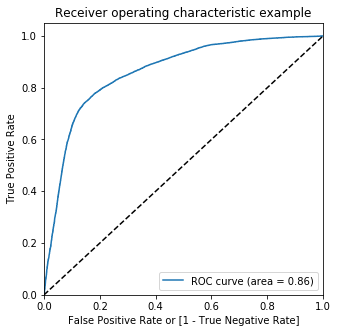

In [207]:
draw_roc(y_train_pred_final.Churned, y_train_pred_final.Churning_Prob)

In [208]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churning_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churned,Churning_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1,0.783086,1,1,1,1,1,1,1,1,0,0
1,0,0.009759,1,0,0,0,0,0,0,0,0,0
2,0,0.050133,1,0,0,0,0,0,0,0,0,0
3,0,0.017621,1,0,0,0,0,0,0,0,0,0
4,0,0.314738,1,1,1,1,0,0,0,0,0,0


#### Plotting sensitivity, specificity and accuracy together

In [209]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churned, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.497565  1.000000  0.000000
0.1   0.1  0.646863  0.976084  0.320834
0.2   0.2  0.691807  0.960258  0.425959
0.3   0.3  0.725610  0.923388  0.529750
0.4   0.4  0.760521  0.878077  0.644105
0.5   0.5  0.787470  0.819812  0.755442
0.6   0.6  0.798087  0.746659  0.849016
0.7   0.7  0.761659  0.610903  0.910954
0.8   0.8  0.647855  0.337866  0.954838
0.9   0.9  0.560241  0.130657  0.985662


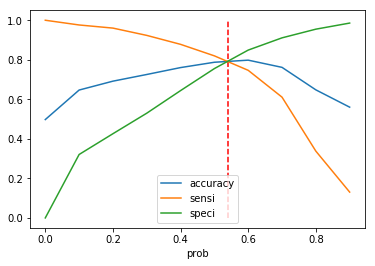

In [210]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.vlines(x=0.54, ymax=1, ymin=0, colors="r", linestyles="--")
plt.show()

### Precision and recall tradeoff

There is always a trade off between Precision & recall. We will see this trade off through precision recall curve

#### Plotting the precision recall curve

In [211]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Churned, y_train_pred_final.Churning_Prob)

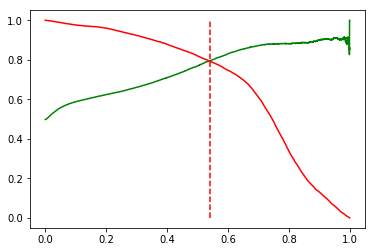

In [212]:
plt.plot(thresholds, p[:-1], "g-") # precision
plt.plot(thresholds, r[:-1], "r-") # recall
plt.vlines(x=0.54, ymax=1, ymin=0, colors="r", linestyles="--")
plt.show()

#### From the 'sensitivity, specificity and accuracy' graph & 'precision recall' curve we see that the optimum cutoff is 54%. Now we see the confusion matrix for test data

In [213]:
y_train_pred_final['predicted_churn'] = y_train_pred_final.Churning_Prob.map(lambda x: 1 if x > 0.54 else 0)

# Let's see the head
y_train_pred_final.head()

,Churned,Churning_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,predicted_churn
0,1,0.783086,1,1,1,1,1,1,1,1,0,0,1
1,0,0.009759,1,0,0,0,0,0,0,0,0,0,0
2,0,0.050133,1,0,0,0,0,0,0,0,0,0,0
3,0,0.017621,1,0,0,0,0,0,0,0,0,0,0
4,0,0.314738,1,1,1,1,0,0,0,0,0,0,0


### Model Evaluation

####  Checking Important metrics that are essential to evaluate the performance of a logistic regression model on test data
* Accuracy
* Sensitivity & Specificity
* Precision & Recall
* F1 score

In [214]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final['Churned'],y_train_pred_final['predicted_churn'] )
print(confusion)

[[13730  3497]
 [ 3520 13540]]


In [215]:
# Defining True & False positive & negative from confusion matrix
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [216]:
# Calculating the Accuracy of the model
(TP+TN)/(TP+TN+FP+FN)

0.7953451745559541

In [217]:
# Calculating the sensitivity of the model
TP / float(TP+FN)

0.7936694021101993

In [218]:
# Calculating specificity
TN / float(TN+FP)

0.7970047019214025

In [219]:
# Calculating the Precision of the model
precision=TP/float(FP+TP)
precision

0.7947408581323003

In [220]:
# Calculating the Recall of the model
recall=TP / float(TP+FN)
recall

0.7936694021101993

In [221]:
# Calculating the F-1 score of the model
F1_score= 2 * (precision * recall) / (precision + recall)
F1_score

0.7942047687479837

#### Making predictions on the test set

In [222]:
X_test = X_test[col]
X_test.head()

,fb_user_8,aon,loc_og_mou_diff,std_og_mou_diff,loc_ic_t2t_mou_diff,loc_ic_t2m_mou_diff,loc_ic_t2f_mou_diff,std_ic_t2m_mou_diff,total_rech_amt_diff
27650,-0.465247,-0.820426,-0.076754,0.282513,0.114522,0.167059,0.018767,0.191296,0.198269
8525,2.149395,-0.110168,0.124162,-0.380736,0.343266,0.466993,-0.052291,-0.292352,-0.155666
46050,-0.465247,-0.530479,0.211497,-0.694420,-0.845890,0.106851,0.014681,-0.434436,-0.473271
12003,-0.465247,-0.284361,-0.222740,0.073820,0.005938,0.217515,0.017308,0.007928,0.191461
17035,2.149395,2.154341,-0.140122,-0.235094,-0.415509,-0.812117,-0.052291,-0.163661,-0.821532


In [223]:
X_test_stat = sm.add_constant(X_test)

In [224]:
# Getting the predicted values on the train set
y_test_pred = res.predict(X_test_stat).values.reshape(-1)

In [225]:
y_test_pred_final = pd.DataFrame({'Churned':y_test.values, 'Churning_Prob':y_test_pred})
y_test_pred_final.head()

,Churned,Churning_Prob
0,1,0.732686
1,0,0.075520
2,1,0.456441
3,0,0.672894
4,0,0.010831


In [226]:
y_test_pred_final['predicted_churn'] = y_test_pred_final.Churning_Prob.map(lambda x: 1 if x > 0.55 else 0)
y_test_pred_final.head()

,Churned,Churning_Prob,predicted_churn
0,1,0.732686,1
1,0,0.075520,0
2,1,0.456441,0
3,0,0.672894,1
4,0,0.010831,0


In [227]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_test_pred_final['Churned'],y_test_pred_final['predicted_churn'] )
print(confusion)

[[5864 1400]
 [1604 5827]]


In [228]:
# Defining True & False positive & negative from confusion matrix
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [229]:
# Calculating the Accuracy of the model
(TP+TN)/(TP+TN+FP+FN)

0.7955767267778155

In [230]:
# Calculating the sensitivity of the model
TP / float(TP+FN)

0.7841474902435742

In [231]:
# Calculating specificity
TN / float(TN+FP)

0.8072687224669604

In [232]:
# Calculating the Precision of the model
precision=TP/float(FP+TP)
precision

0.80628199806282

In [233]:
# Calculating the Recall of the model
recall=TP / float(TP+FN)
recall

0.7841474902435742

In [234]:
# Calculating the F-1 score of the model
F1_score= 2 * (precision * recall) / (precision + recall)
F1_score

0.7950607176968207

### Top important features

<b>Top important features which increases probablity of customer getting churn
<b>
    
            Features	         Description
    total_rech_amt_diff	         Difference in Total recharge amount (from 6&7th to 8th month)
    loc_ic_t2m_mou_diff	         Difference in local incoming mins. of usage voice calls from T operator to other operator (from 6&7th to 8th month)
        std_og_mou_diff	         Difference in std outgoing mins. of usage voice calls (from 6&7th to 8th month)
    loc_ic_t2t_mou_diff	         Difference in local incoming mins. of usage voice calls from T operator to T (from 6&7th to 8th month)
    std_ic_t2m_mou_diff	         Difference in std incoming mins. of usage voice calls from T operator to other operator (from 6&7th to 8th month)
    
<b>Top important features which decreases probablity of customer getting churn     

           Features	             Description    
       fb_user_8	        	Service scheme to avail services of Facebook and similar social networking sites (in 8th month)
       aon	    	            Age on network - number of days the customer is using the operator T network
       loc_og_mou_diff	        Difference in local outgoing mins. of usage voice calls (from 6&7th to 8th month)
       loc_ic_t2f_mou_diff	    Difference in std incoming mins. of usage voice calls from T operator to other operator (from 6&7th to 8th month)

## Results

<b>
   In the highly competitive market where the telecommunication companies experience high churn rate of customers, Company should focus on existing high value customers retention as acquiring new customer is more costly than retaining the existing ones.
For the telecom company, there are many high value customers. Previously, the company would have to target all these high value customers as there was no predictive model in place to predict the customers who has high risk of churn.

We see that the high value customers who can churn is around 8 % of the total number of high value customers. Now with the prediction model in place, we can predict approx. 94 % of the high value customers who have high risk of churn and 90% of the high value customers who may not churn in near future beforehand.

Therefore, we will have to target a very small set (~8%) of high value customers who have high risk of churn and thus the company can effectively use its resources on a focused group and also save on cost, time and manpower requirements to retain these high value customers.

Telecom company should also focus on the most important features which are increasing the probability of these customers getting churned. These variables may also indicate why customers choose to switch to other networks. And based on knowledge of these features, company can bundle some offers to these customers to retain the customers.